# Introduction #

In this project, we will tackle for the first time some unstructured data. Unstructured data can come in many forms such as audio, text, image por video files. The process to extract the information will depend on the data form.

Our goal will be to classify objects thanks to their description and photo. We will thus have to process text and image data. On one hand, we will have strings of characters representing sentences and on the other hand, matrixes representing the pixel of the images. 

The preprocesses of these data types will be different and explained in more details further.

# Imports #

## Libraries ##

### Libraries ###

We will first import all the libraries that will be needed in this project.

In [52]:
# Standard Libraries
import pandas as pd
import numpy as np
import scipy.stats as st
from scipy.cluster.vq import kmeans, vq
import random
import re
from time import time
from varname import argname2

# Plotting Libraries
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
from matplotlib.ticker import NullFormatter
import seaborn as sns

# Text Libraries
import nltk
import gensim
from gensim.models import Word2Vec
from wordcloud import WordCloud

# Image Libraries
import cv2 as cv

# Machine Learning Libraries
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.feature_extraction.text import TfidfVectorizer, TfidfTransformer
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import MiniBatchKMeans
from sklearn.svm import LinearSVC
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
from keras.models import Sequential
from keras.applications.vgg16 import VGG16
from keras.callbacks import ModelCheckpoint

# Personnal Functions Related to This Project
from P6_functions import *

### Fonctions ###

## Data ##

### Data Selection ###

We import the data but we will only retain the features that will interest us, which is to say the categories we want to classify upon, the unique ID of each product associated with its description and image. 

In [2]:
# Reading the csv file
data_df = pd.read_csv('Ressources' + '/' + 'flipkart_com-ecommerce_sample_1050.csv', 
                      usecols=['uniq_id', 'product_category_tree', 'image', 'description'])

# First look of the database
data_df

,uniq_id,product_category_tree,image,description
0,55b85ea15a1536d46b7190ad6fff8ce7,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...
1,7b72c92c2f6c40268628ec5f14c6d590,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...
2,64d5d4a258243731dc7bbb1eef49ad74,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...
3,d4684dcdc759dd9cdf41504698d737d8,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...
4,6325b6870c54cd47be6ebfbffa620ec7,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...
...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",958f54f4c46b53c8a0a9b8167d9140bc.jpg,Oren Empower Extra Large Self Adhesive Sticker...
1046,fd6cbcc22efb6b761bd564c28928483c,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",fd6cbcc22efb6b761bd564c28928483c.jpg,Wallmantra Large Vinyl Sticker Sticker (Pack o...
1047,5912e037d12774bb73a2048f35a00009,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",5912e037d12774bb73a2048f35a00009.jpg,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,Buy Wallmantra Medium Vinyl Sticker Sticker fo...


### Data Preprocessing ###

We will explore, rearrange and clean very quickly the data. We will do further cleaning later on. 

The first thing we will do is to separate the differents categories of product to help with the later classification.

In [3]:
# String manipulations to separate the different categories of product
for i in range(len(data_df)):
    data_df.loc[i, 'product_category_tree'] = data_df.loc[i, 'product_category_tree'].replace('"]' , '')
    data_df.loc[i, 'product_category_tree']= data_df.loc[i, 'product_category_tree'].replace('["' , '')
    category_list = data_df.loc[i, 'product_category_tree'].split(' >> ')
    for j in range(len(category_list)):
        if j+1 == len(category_list):
            data_df.loc[i, 'product_name'] = category_list[j]
        else:
            data_df.loc[i, 'category {}'.format(j+1)] = category_list[j]

# Reordering the columns
data_df = data_df[['uniq_id', 'product_name', 'description', 'image', 
                   'category 1', 'category 2', 'category 3', 'category 4', 
                   'category 5', 'category 6']]
data_df = data_df.rename(columns={'uniq_id':'id', 'product_name':'name'})
data_df

,id,name,description,image,category 1,category 2,category 3,category 4,category 5,category 6
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,Curtains & Accessories,Curtains,NaN,NaN,NaN
1,7b72c92c2f6c40268628ec5f14c6d590,"Sathiyas Cotton Bath Towel (3 Bath Towel, Red,...",Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,Baby Bath & Skin,Baby Bath Towels,Sathiyas Baby Bath Towels,NaN,NaN
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set (20 PIECE ...,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,Baby Bath & Skin,Baby Bath Towels,Eurospa Baby Bath Towels,NaN,NaN
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,Bed Linen,Bedsheets,SANTOSH ROYAL FASHION Bedsheets,NaN,NaN
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,Bed Linen,Bedsheets,Jaipur Print Bedsheets,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,Oren Empower Stickers,Oren Empower Extra Large Self Adhesive Sticker...,958f54f4c46b53c8a0a9b8167d9140bc.jpg,Baby Care,Baby & Kids Gifts,Stickers,NaN,NaN,NaN
1046,fd6cbcc22efb6b761bd564c28928483c,Wallmantra Stickers,Wallmantra Large Vinyl Sticker Sticker (Pack o...,fd6cbcc22efb6b761bd564c28928483c.jpg,Baby Care,Baby & Kids Gifts,Stickers,NaN,NaN,NaN
1047,5912e037d12774bb73a2048f35a00009,Uberlyfe Stickers,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,5912e037d12774bb73a2048f35a00009.jpg,Baby Care,Baby & Kids Gifts,Stickers,NaN,NaN,NaN
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,Wallmantra Stickers,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,Baby Care,Baby & Kids Gifts,Stickers,NaN,NaN,NaN


We will now look if there is any missing information.

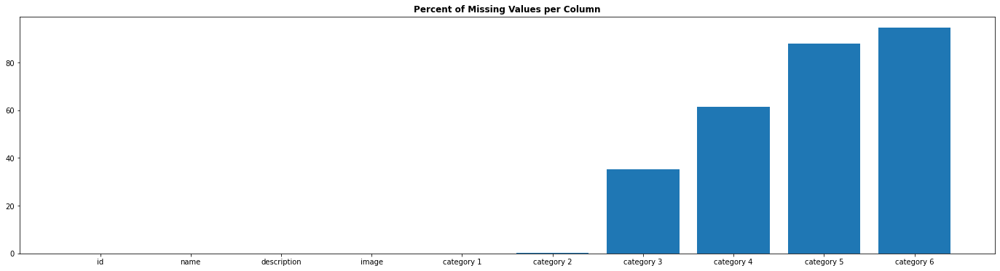

In [4]:
# Preparation pour le graphe
missing_df = data_df.isna().sum().to_frame()
missing_df = missing_df/len(data_df)*100
missing_df.columns = ['Count']

# Graphe 
fig, ax = plt.subplots(1, 1, figsize=(24,6))

# Missing Data
ax.bar(missing_df.index, missing_df['Count'])
ax.set_title('Percent of Missing Values per Column', fontsize=12, fontweight='bold')
plt.savefig('Ressources' + '/' + 'Soutenance' + '/' + 'Missing Values.png')

We can see that there is no product with large missing values. We can also see that the products mostly have 2 to 3 categories that are well described.

Next we will count the unique values of each column.

In [5]:
# Printing the unique values of each column
print('The total number of products in the database is {}.\n\n'.format(len(data_df)))
for col in data_df.columns:
    print('The column {} has {} unique values.'.format(col, data_df[col].nunique()))

The total number of products in the database is 1050.


The column id has 1050 unique values.
The column name has 642 unique values.
The column description has 1050 unique values.
The column image has 1050 unique values.
The column category 1 has 7 unique values.
The column category 2 has 61 unique values.
The column category 3 has 143 unique values.
The column category 4 has 161 unique values.
The column category 5 has 76 unique values.
The column category 6 has 47 unique values.


We can see that we have no duplicates in the unique ID, image and description of each row. However, some products seems to have the same name. It might be a same product with different colors for example.

Between the missing values and the unique values increase, we can safely assume that being able to classify up until the third category of product should be enough information for most product. We will thus only keep the three main category of products.

In [6]:
# Getting rid of the column without much information
data_df = data_df.drop(columns=['category 4','category 5','category 6'])
print('The new database has {} rows and {} columns.'.format(data_df.shape[0], data_df.shape[1]))

The new database has 1050 rows and 7 columns.


We will replace the NaN values in the categories by a new category called 'Unknown'.

We will look at how many products there are in each category.

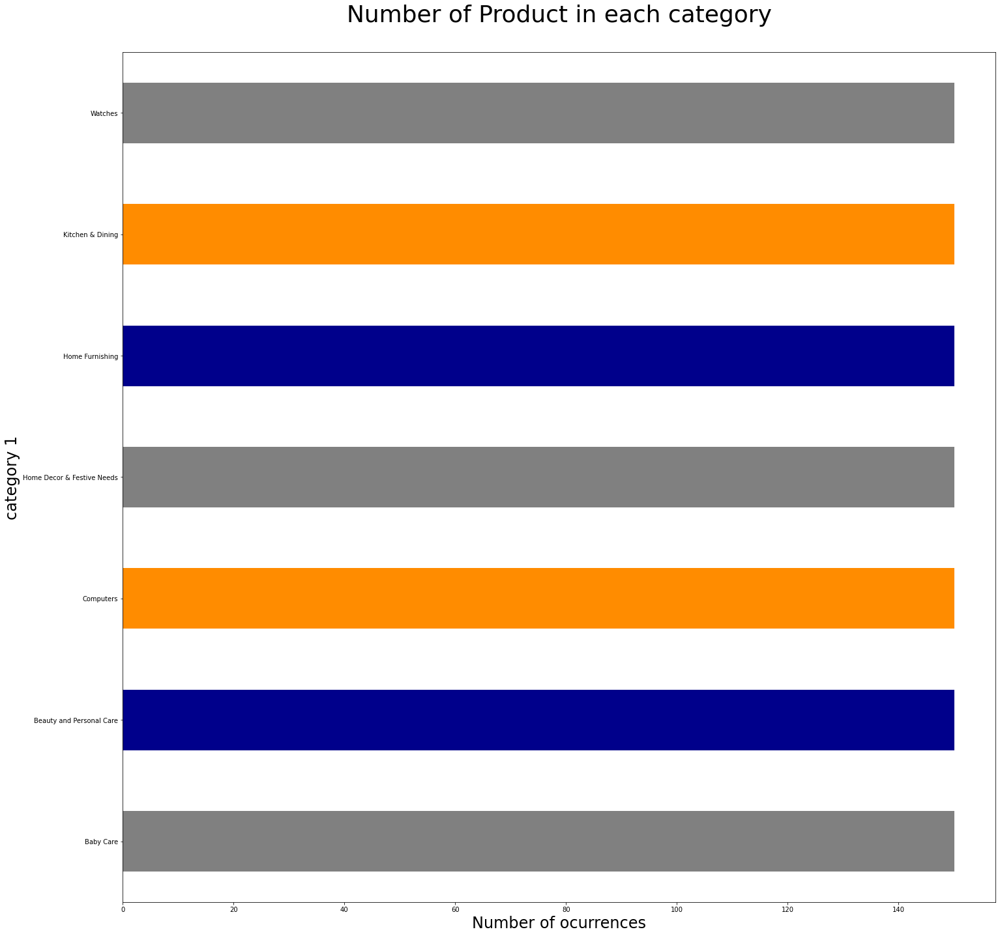

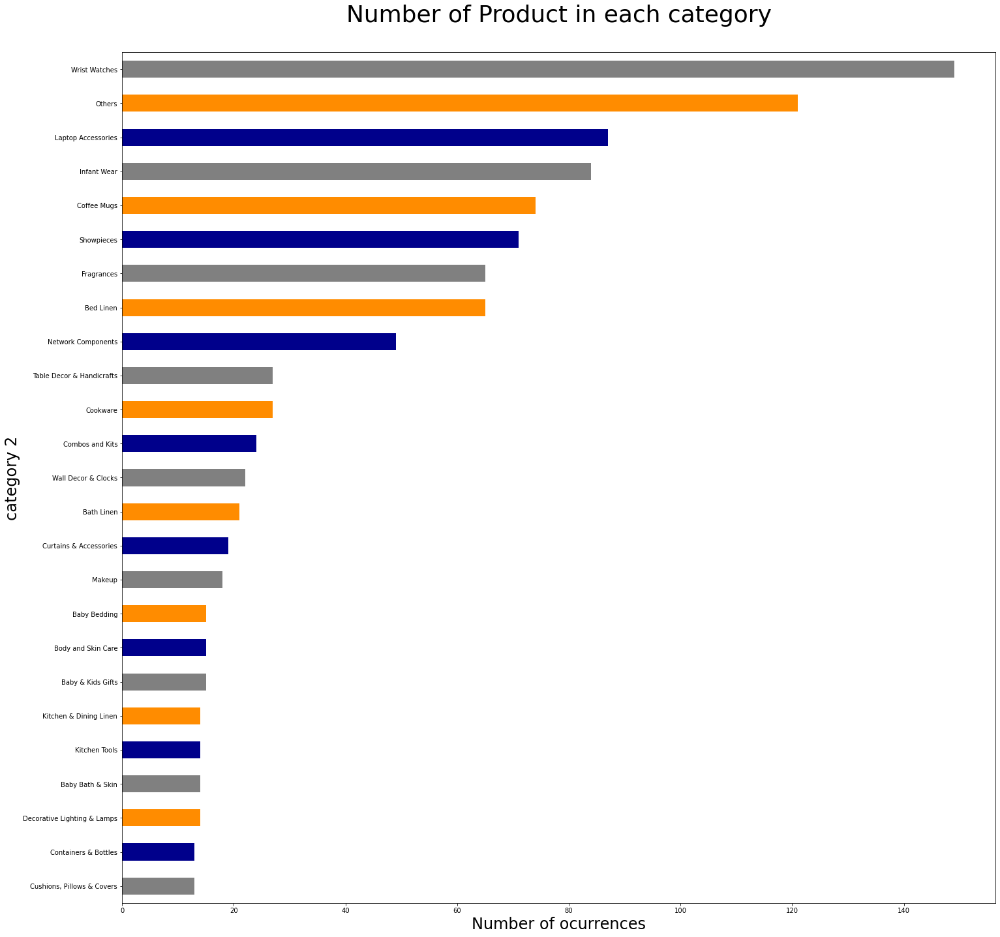

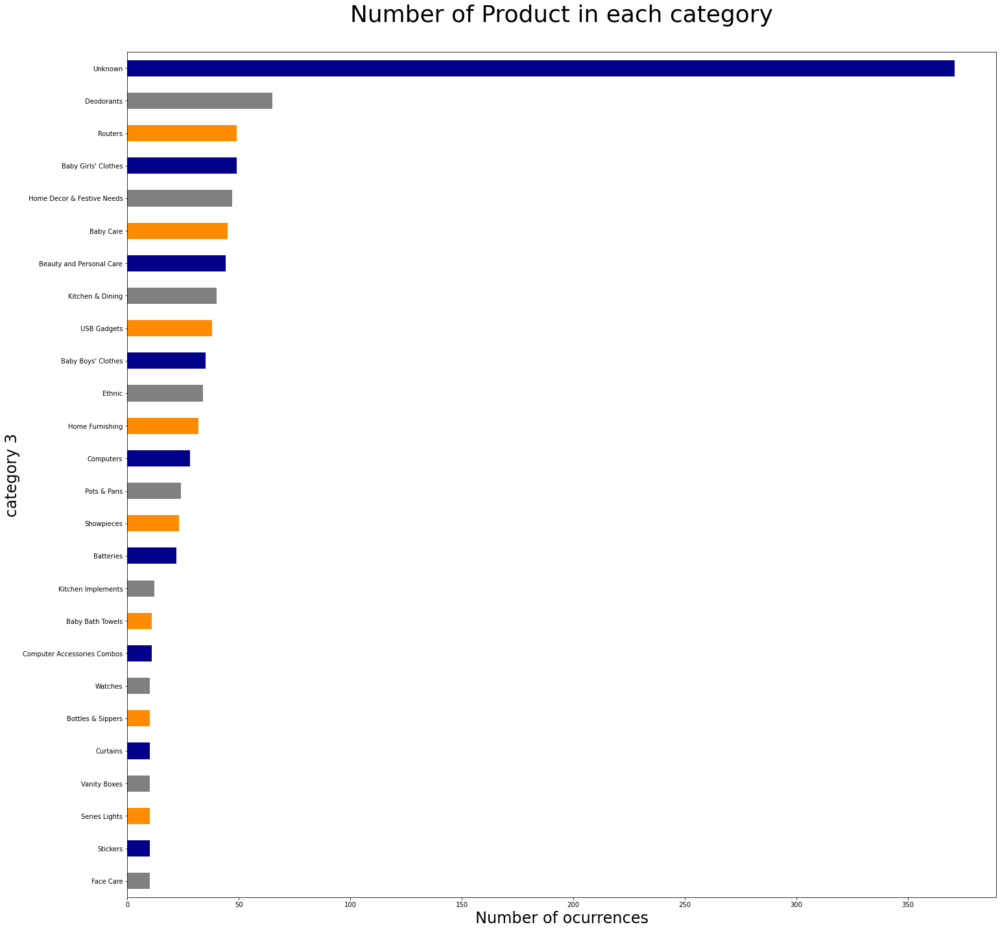

In [49]:
# Ploting the number of occurences for each level of category
for i in range(1,4):
    fig = plt.figure(figsize=(24,24))
    colors = ['grey','darkblue', 'darkorange']
    data_df.groupby('category {}'.format(i)).id.count().sort_values().plot.barh(
        ylim=0, color=colors)
    plt.title('Number of Product in each category\n', fontsize=36)
    plt.xlabel('Number of ocurrences', fontsize=24)
    plt.ylabel(f'category {i}', fontsize=24)
    plt.savefig('Ressources' + '/' + 'Soutenance' + '/' + 'Products per Category Level {}.png'.format(i))

We will also take te least represented classes and gather them under a new class call 'Others' in the categeories of level 2 and we will apply the category of level 1 for the ones in the categories level 3.

In [9]:
# For the Categories level 2
for i, j in data_df['category 2'].value_counts().iteritems():
    if j < 10:
        data_df['category 2'].replace(to_replace=i, value='Others', inplace=True)

# For the Categories level 3
for i, j in data_df['category 3'].value_counts().iteritems():
    if j <10 :
        cat_index = data_df[data_df['category 3'] == i].index[0]
        cat_lvl_1 = data_df.loc[cat_index, 'category 1']
        data_df['category 3'].replace(to_replace=i, value=cat_lvl_1, inplace=True)

# Text Data #

## Preprocessing ## 

To be able to use the text data, we will have to go through several transformations and cleaning. 

For each step, we will take a text example to best visualize the transformations.

Before, we will also make a copy of the dataframe.

In [50]:
# Copy of dataframe
data_df_copy = data_df.copy()

# Initializing the test text
test_text = "This is a text, made to illustrate the text's transformations \
processes that will and have occured."

print(test_text)

This is a text, made to illustrate the text's transformations processes that will and have occured.


### Tokenization ###

The first step is to separate the text data word by word and suppressing the ponctuation at the same time. This will ease the extraction of the information.

In [11]:
# Tokenizing the test text
tokenizer = nltk.RegexpTokenizer(r'\w+')
test_tokens = tokenizer.tokenize(test_text)
test_tokens

['This',
 'is',
 'a',
 'text',
 'made',
 'to',
 'illustrate',
 'the',
 'text',
 's',
 'transformations',
 'processes',
 'that',
 'will',
 'and',
 'have',
 'occured']

In [12]:
# Lowering the letters
test_tokens = tokenizer.tokenize(test_text.lower())
test_tokens

['this',
 'is',
 'a',
 'text',
 'made',
 'to',
 'illustrate',
 'the',
 'text',
 's',
 'transformations',
 'processes',
 'that',
 'will',
 'and',
 'have',
 'occured']

#### Stopwords suppression ####

Stopwords being quite light in information, we will get rid of them to ease the later processes.

In [13]:
# Fetching the list of stop words in english from the nltk library
stop_words = set(nltk.corpus.stopwords.words('english'))

# Suppression of the stop words in our tokens
clean_test_tokens = []
for word in test_tokens:
    if word not in stop_words:
        clean_test_tokens.append(word)

clean_test_tokens

['text',
 'made',
 'illustrate',
 'text',
 'transformations',
 'processes',
 'occured']

#### Lemmatisation and Stemming ####

Stemming consist of cutting words to get rid of prexifes, suffixes, etc.

Lemmatisation consist of reprensenting words by one word regardless of grammar and conjugation. For exemple, 'kings' and 'king' would be represented by 'king'. 'Were', 'was' and 'are' would be represented by 'be'.

We will use the lemmatisation process here as it will keep more context and thus information.

First, we tag the words with the associated part of speech. In a nutshell, we explicite if a word is a verb, a noun or an adjective for the lemmatisation process to be complete.

In [14]:
# Tagging the tokens
pos_tagger = nltk.pos_tag(clean_test_tokens)
tagged_tokens = list(map(lambda x: (x[0], get_wordnet_pos(x[1])), pos_tagger))

tagged_tokens

[('text', 'n'),
 ('made', 'v'),
 ('illustrate', 'a'),
 ('text', 'a'),
 ('transformations', 'n'),
 ('processes', 'n'),
 ('occured', 'v')]

Now we can do the lemmatization in itself.

In [15]:
# Lemmatizing
lemmated_test_tokens = lemmatize_tokens(tagged_tokens)

lemmated_test_tokens

['text', 'make', 'illustrate', 'text', 'transformation', 'process', 'occur']

With all the preprocesses, we were able to go from a sentence to its main information.

In [16]:
print('We went from this :\n {} \n to this :\n{}'.format(test_text, lemmated_test_tokens))

We went from this :
 This is a text, made to illustrate the text's transformations processes that will and have occured. 
 to this :
['text', 'make', 'illustrate', 'text', 'transformation', 'process', 'occur']


We will now apply all these pre treatments to the description of all our products.

In [17]:
# Transforming the description into the the associated tokens
for i in range(len(data_df)):
    data_df.loc[i, 'description'] = text_preprocessing(data_df.loc[i, 'description'])

### Bag of words ###

For the algorithm to be able to understand the meanings of the word, we will create some 'bags of words'. Simply put, we will have a bag with all the words associated to an idea. 

In our case, our 'bags' will represent a category. We will thus create a bag of words for each category.

In [18]:
# Finding all the words in the database
all_words = find_all_words(data_df, 'description')

# Creating bags of words for each category level
category_1_df = create_BoW_dataframe(data_df, 'category 1')
category_2_df = create_BoW_dataframe(data_df, 'category 2')
category_3_df = create_BoW_dataframe(data_df, 'category 3')

Time needed for category 1 is 9.37 seconds.
Time needed for category 2 is 11.56 seconds.
Time needed for category 3 is 11.62 seconds.


Now that the bags of words are created, we will take a look at them thanks to 'word clouds'. 

Word clouds are representation of bags of words. The more a word is in the bag, the bigger it will appear. This enable us to have a rough idea of what is in the bag and if the words associated to the idea seem plausible.

We will first take a look at the word cloud of all the word in our data set. We could see it as a representation of what the website is selling. 

Time elapsed : 1.4424550533294678 s.


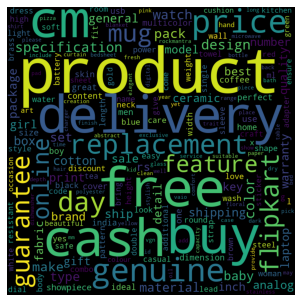

In [19]:
t0 = time()
all_text = ' '.join(all_words)
wordcloud = WordCloud(width=800, height=800, collocations=False).generate(all_text)
plt.figure(figsize=(4,4), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
t1 = time()
print('Time elapsed : {} s.'.format(t1-t0))
plt.savefig('Ressources' + '/' + 'Soutenance' + '/' + 'WordCloud_All.png')
plt.show()

We can see that the main words are words associated with selling and marketing. It seems logical so far.

Now, let's take a look at the bags of the first level of categories.

Time elapsed : 9.41122317314148 s.



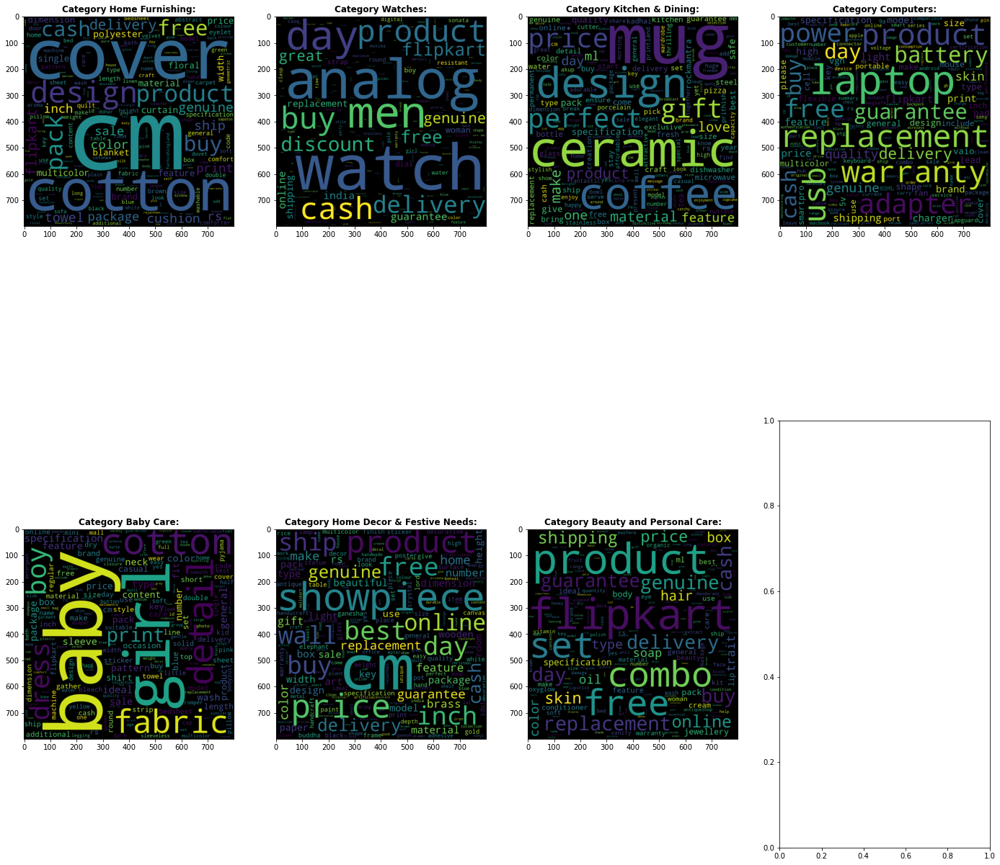

In [20]:
create_WC_from_DF(category_1_df)

We can now see in more details some words associated to categories. They all seem to fit in their category names.

Next, let's take a look at the bags of the second level of categories.

Time elapsed : 32.587605237960815 s.



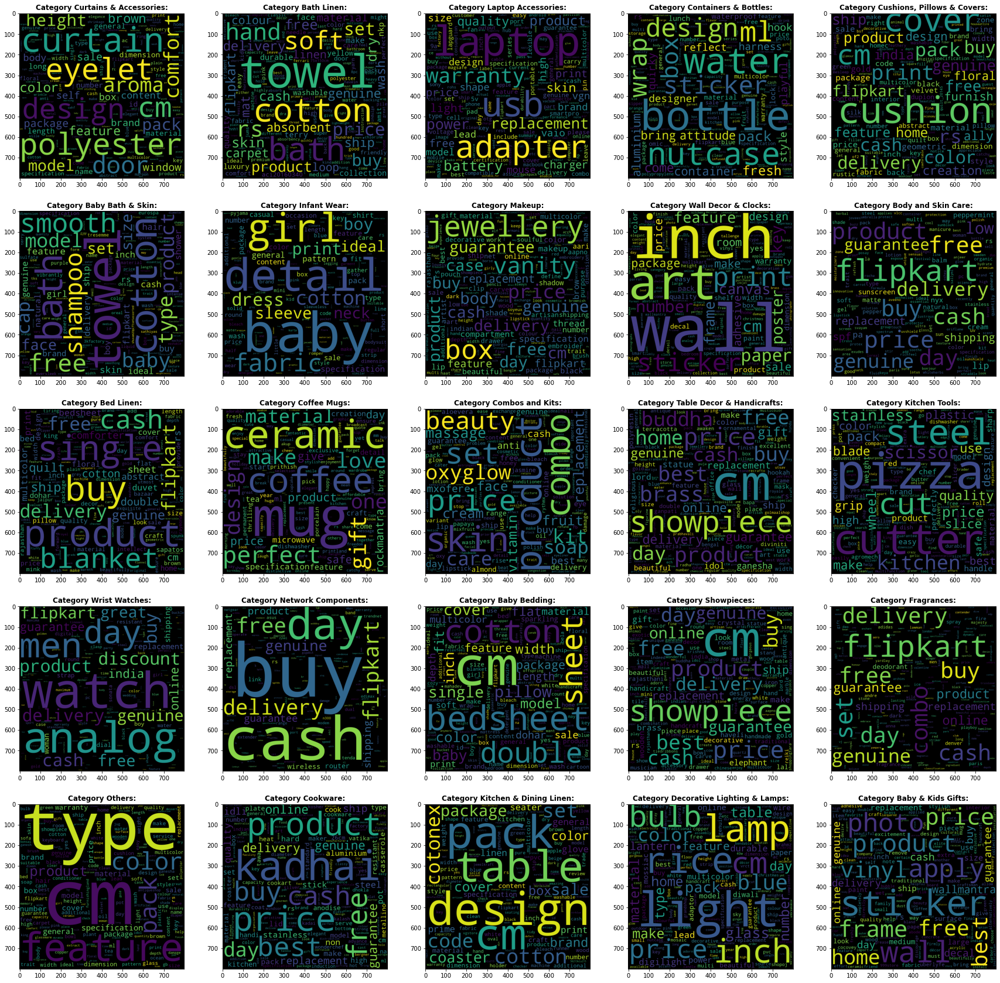

In [21]:
create_WC_from_DF(category_2_df)

It is still working, it seems like we are on the right track!

Lastly, we will look at the bags of the third level of categories.

Time elapsed : 31.157953023910522 s.



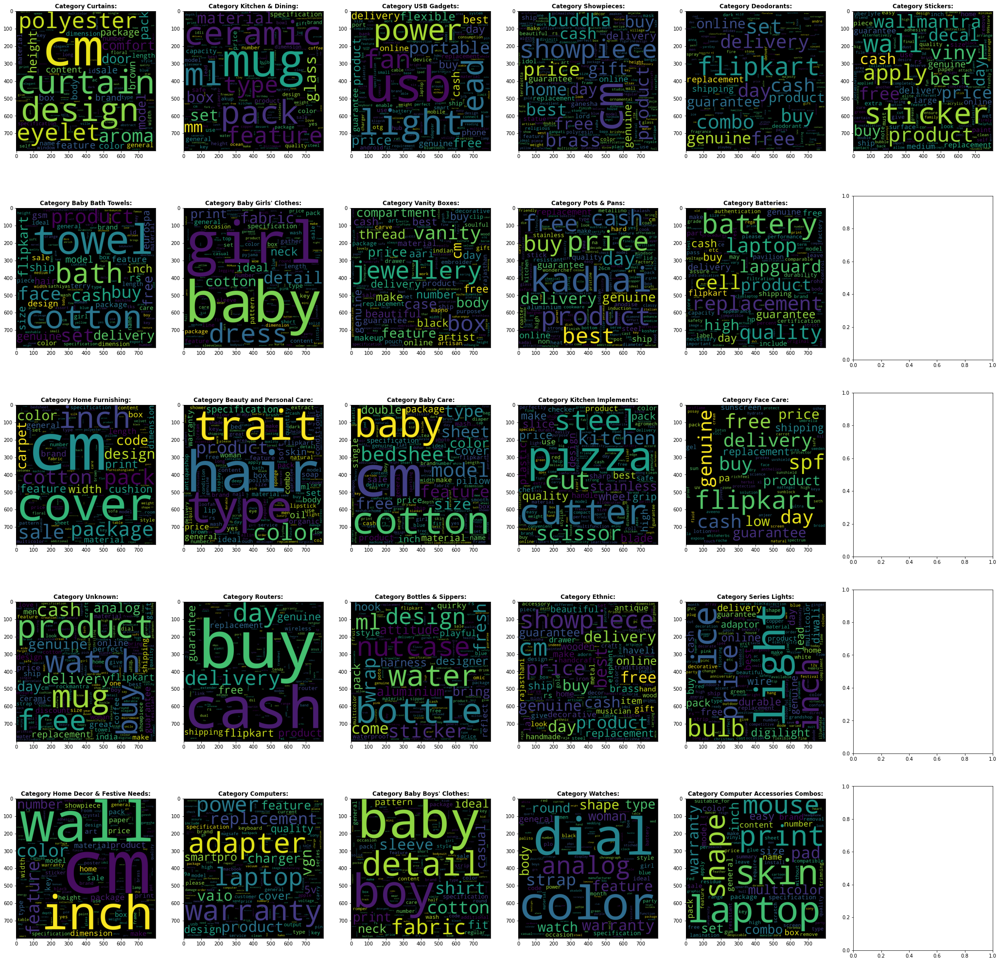

In [22]:
create_WC_from_DF(category_3_df)

## Word Embedding ##

Another approach to giving meaning of words for the computer is to associate a vector to each words depending on their use and means. We will see two methods that uses this idea.

### Term Frequency - Inverse Document Frequency (tf-idf) ###

The first approach is the Term Frequency - Inverse Document Frequency (tf-idf) approach. 

As its name implies, this technique look at the frequency of a word in a document and in general to see if the word is specific to a document. It will give a 'score of specificity' for each word of each document.

With this approach, we will take the entire description of a product and associate a vector to it that will represent the words of that description. We can then compare the vectors and see how different or close they are and probably guess that the more alike two descriptions are, the more chance they belong to a same category.

In [23]:
# Initializaing the tf-idf
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5, ngram_range=(1,2), stop_words='english')

# Transforming the descriptions into vectors
features = tfidf.fit_transform(data_df_copy['description']).toarray()
labels_1 = data_df_copy['category 1']
labels_2 = data_df_copy['category 2']
labels_3 = data_df_copy['category 3']

print("Each of the {} description is represented by {} features (TF-IDF score of \
unigrams and bigrams)".format(features.shape[0], features.shape[1]))

Each of the 1050 description is represented by 2227 features (TF-IDF score of unigrams and bigrams)


We will use a reduction of the dimensions of our features with a t-SNE. This will enable us to have a look at the distribution of the descriptions.

In [24]:
# Computing t-SNE
tsne = TSNE(n_components=2, perplexity=600, n_iter=600, init='pca')
t0 = time()
X_tsne = tsne.fit_transform(features)
t1 = time()
tsne_time = t1-t0
print('Time elapsed : {} s.'.format(tsne_time))

Time elapsed : 8.78061056137085 s.


Then, we can look at our data and try to see if we see any pattern.

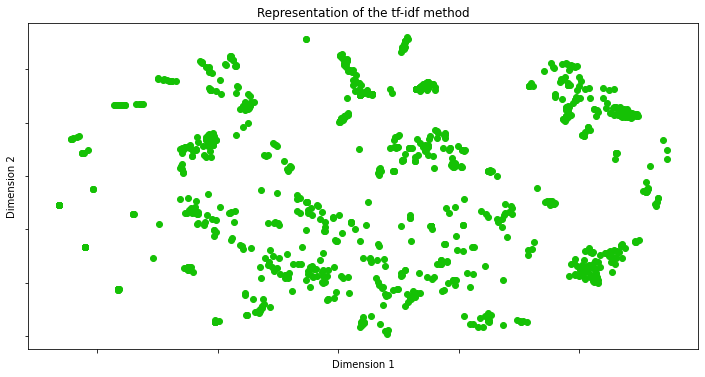

In [25]:
# Representation of tf-idf method
x_vals = X_tsne[:,0]
y_vals = X_tsne[:,1]

fig, ax = plt.subplots(figsize = (12,6))
color_palette = ['#15c105']
ax.set_prop_cycle(color=color_palette)
ax.scatter(x_vals, y_vals)
    
ax.set_title('Representation of the tf-idf method')
ax.set_xlabel('Dimension 1')
ax.set_ylabel('Dimension 2')
ax.xaxis.set_major_formatter(NullFormatter())
ax.yaxis.set_major_formatter(NullFormatter())
ax.axis('tight')

plt.savefig('Ressources' + '/' + 'Soutenance' + '/' + 'Text tf-idf.png')
plt.show()

There seem to be some clusters but we don't know if they are related to our categories yet. 

### Word to Vector ###

The second approach is to vectorize a word depending on its meaning. For that, we will use 'Word2Vec' which is a model developped by Google and trained on a large set of text to understand the meaning of most words. With this model, it is possible for the machine to say that 'king' is closer to 'queen' than to 'cat' for exemple. It can even say that the difference between 'king' and 'queen' is the same as betweem 'boy' and 'girl'.

So using Word2Vec, we will embedd our text data. We will vectorize the words and then the descriptions. 

We will use two different techniques. The first one is the 'Continuous Bag of Words' which will concentrate on trying to predict a word given the words around when fitting to our data.

The second one is the 'Skip Gram' one which when fitting our data will try to predict the surounding words given a specific word.

In [26]:
# Continuous Bag Of Words Model predicts the current word given the context words.
CBOW_model = Word2Vec(data_df['description'], min_count=5)
CBOW_vectors = np.asarray(CBOW_model.wv.vectors)
CBOW_labels = np.asarray(CBOW_model.wv.index_to_key)

# Skip Gram model predicts the surrouding context words given the current word.
SkipGram_model = Word2Vec(data_df['description'], min_count=5, sg=1)
SkipGram_vectors = np.asarray(SkipGram_model.wv.vectors)
SkipGram_labels = np.asarray(SkipGram_model.wv.index_to_key)

Let's now take a look at the distribution of our product using the Continuous Bag of Words (CBOW) technique.

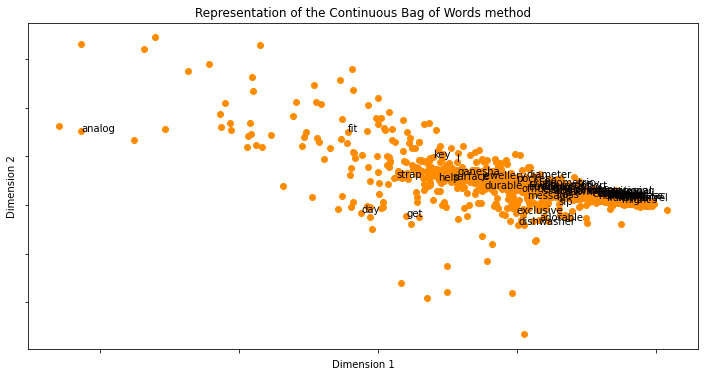

In [27]:
# Representation of Continuous Bag of Words Model
x_vals = [v[0] for v in CBOW_vectors]
y_vals = [v[1] for v in CBOW_vectors]

fig, ax = plt.subplots(figsize = (12,6))
color_palette = ['darkorange']
ax.set_prop_cycle(color=color_palette)
ax.scatter(x_vals, y_vals)

indices = list(range(len(CBOW_labels)))
selected_indices = random.sample(indices, 60)
for i in selected_indices:
    plt.annotate(CBOW_labels[i], (x_vals[i], y_vals[i]))
    
ax.set_title('Representation of the Continuous Bag of Words method')
ax.set_xlabel('Dimension 1')
ax.set_ylabel('Dimension 2')
ax.xaxis.set_major_formatter(NullFormatter())
ax.yaxis.set_major_formatter(NullFormatter())
ax.axis('tight')

plt.savefig('Ressources' + '/' + 'Soutenance' + '/' + 'Text CBOW.png')
plt.show()

As we can see, there is a big cluster of words that the model think are close to each other in meaning and then a 'spray' of other words that are more distant in meaning.

Next, we will look at the distribution found thanks to the Skip Gram technique.

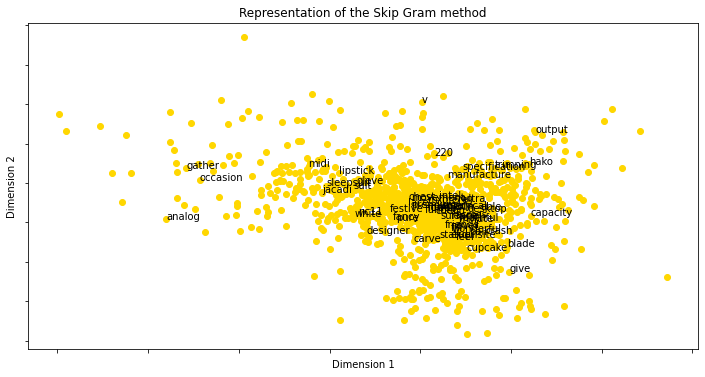

In [28]:
# Representation of Skip Gram Model
x_vals = [v[0] for v in SkipGram_vectors]
y_vals = [v[1] for v in SkipGram_vectors]
fig, ax = plt.subplots(figsize = (12,6))
color_palette = ['gold']
ax.set_prop_cycle(color=color_palette)
ax.scatter(x_vals, y_vals)

indices = list(range(len(SkipGram_labels)))
selected_indices = random.sample(indices, 60)
for i in selected_indices:
    plt.annotate(SkipGram_labels[i], (x_vals[i], y_vals[i]))
    
ax.set_title('Representation of the Skip Gram method')
ax.set_xlabel('Dimension 1')
ax.set_ylabel('Dimension 2')
ax.xaxis.set_major_formatter(NullFormatter())
ax.yaxis.set_major_formatter(NullFormatter())
ax.axis('tight')

plt.savefig('Ressources' + '/' + 'Soutenance' + '/' + 'Text SkipGram.png')
plt.show()

Here, the data seems to be more evenly spread with still a cluster in the middle. This method will probably give better results on our data, but we will see afterwards.

### t-SNE ### 

Using a dimension reduction with a t-SNE, we will look at the three method (tf-idf, CBOW and Skip Gram) and see on at the same time the distribution of the description and their associated category to see if the cluster are well defined.

First, we initialize the t-SNE.

In [29]:
# Creating vectorization of description from Word2Vec methods
X_CBOW = create_W2V_X(CBOW_model, data_df)
X_SkipGram = create_W2V_X(SkipGram_model, data_df)

# Computing t-SNE
tsne = TSNE(n_components=2, perplexity=600, n_iter=600, init='pca')

X_tsne_tfidf = tsne_transformation(features, 'tf-idf', tsne)
X_tsne_CBOW = tsne_transformation(X_CBOW, 'Continuous Bag Of Words', tsne)
X_tsne_SkipGram = tsne_transformation(X_SkipGram, 'Skip Gram', tsne)

Time elapsed for the tf-idf method: 7.72198748588562 s.
Time elapsed for the Continuous Bag Of Words method: 7.2462146282196045 s.
Time elapsed for the Skip Gram method: 6.6511149406433105 s.


Now we can look at it depending on the different level of categories to see if there is one correponding more closely to the clusters.

#### Categories of level 1 ####

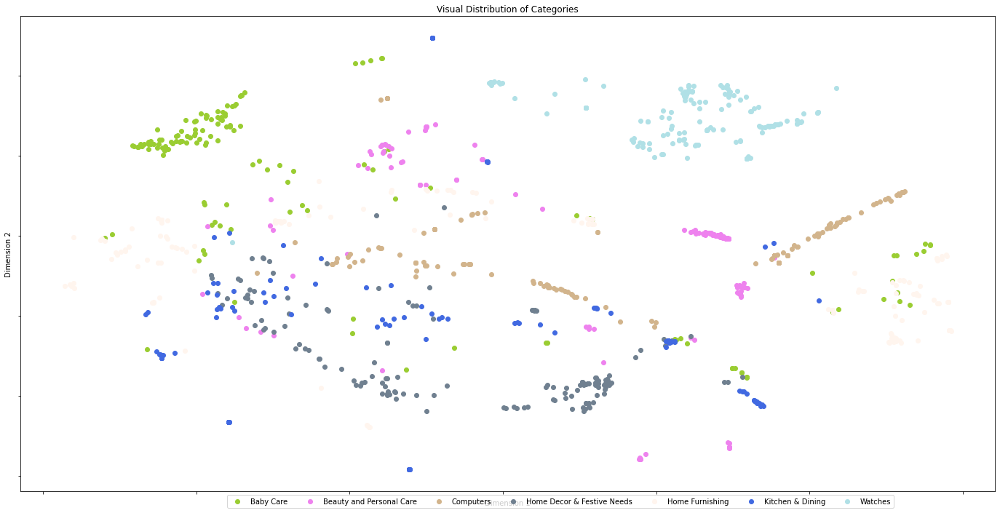

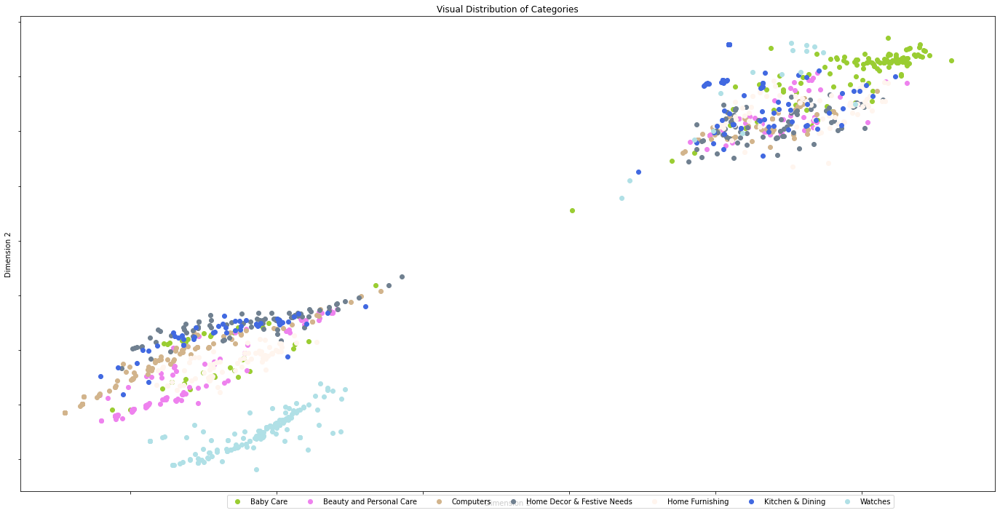

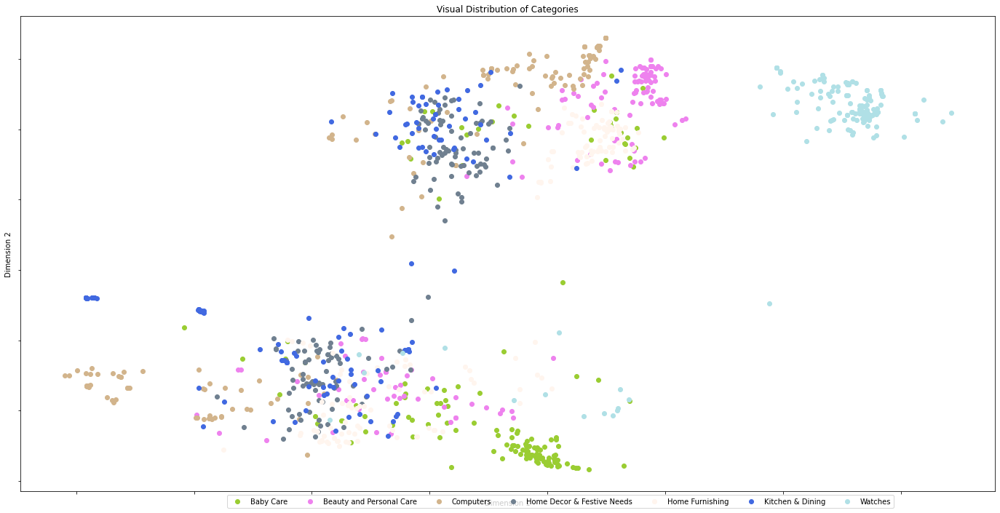

In [30]:
visualize_tsne(X_tsne_tfidf, labels_1, 'tfidf', '1', 'Text')
visualize_tsne(X_tsne_CBOW, labels_1, 'CBOW', '1', 'Text')
visualize_tsne(X_tsne_SkipGram, labels_1, 'SkipGram', '1', 'Text')

The first level of category seems to have a few category well separated but the other ones quite mixed.

#### Categories of level 2 ####

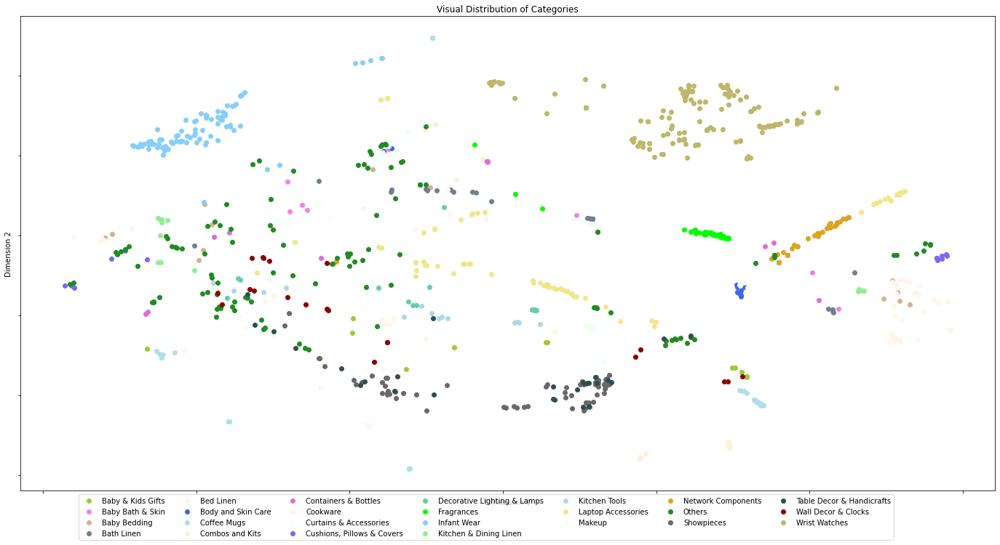

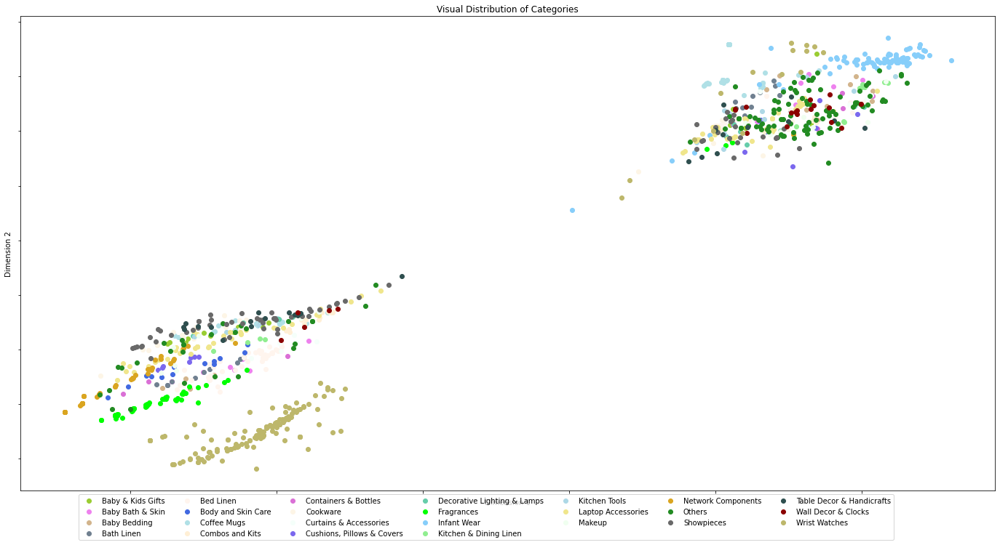

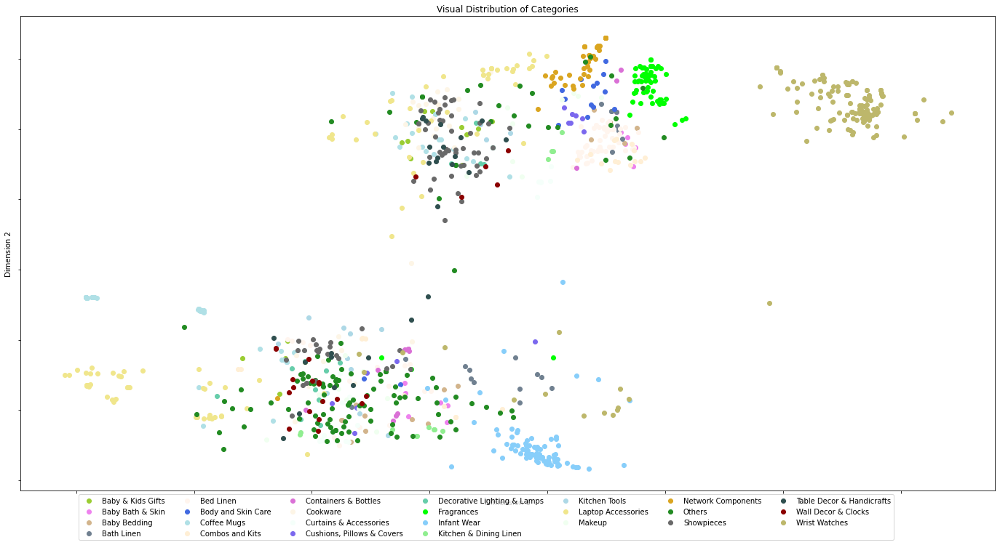

In [31]:
visualize_tsne(X_tsne_tfidf, labels_2, 'tfidf', '2', 'Text')
visualize_tsne(X_tsne_CBOW, labels_2, 'CBOW', '2', 'Text')
visualize_tsne(X_tsne_SkipGram, labels_2, 'SkipGram', '2', 'Text')

As for the first level, few categories are well separated and most of them are mixed with each other.

#### Categories of level 3 ####

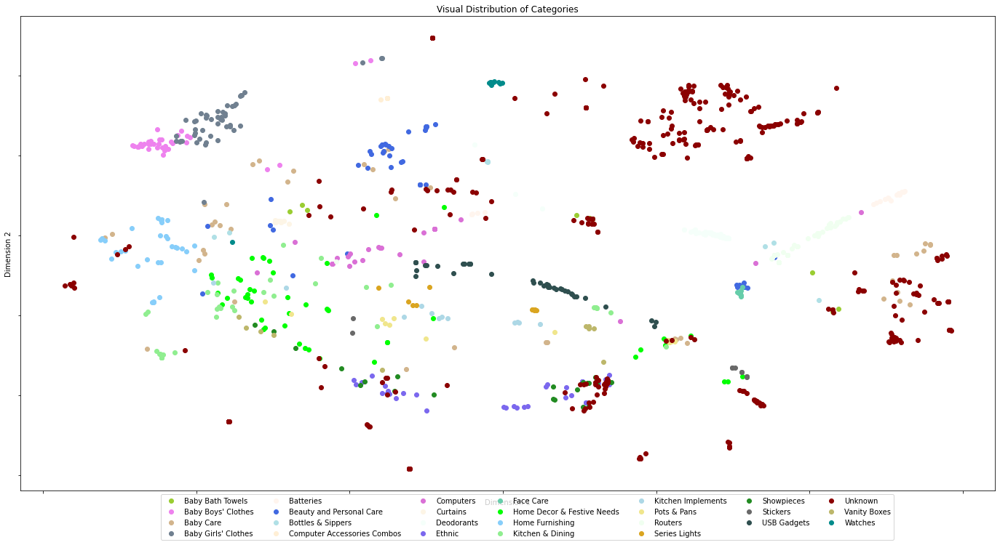

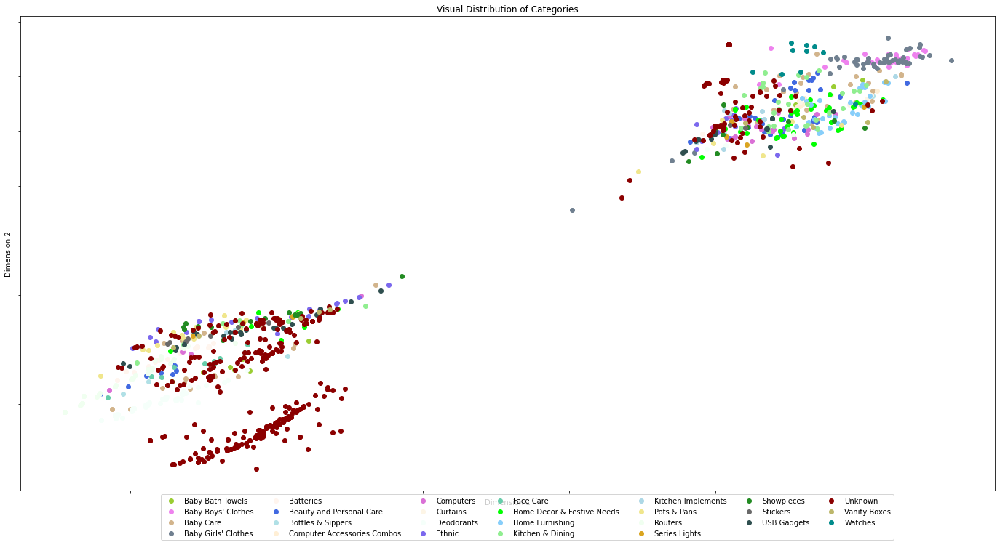

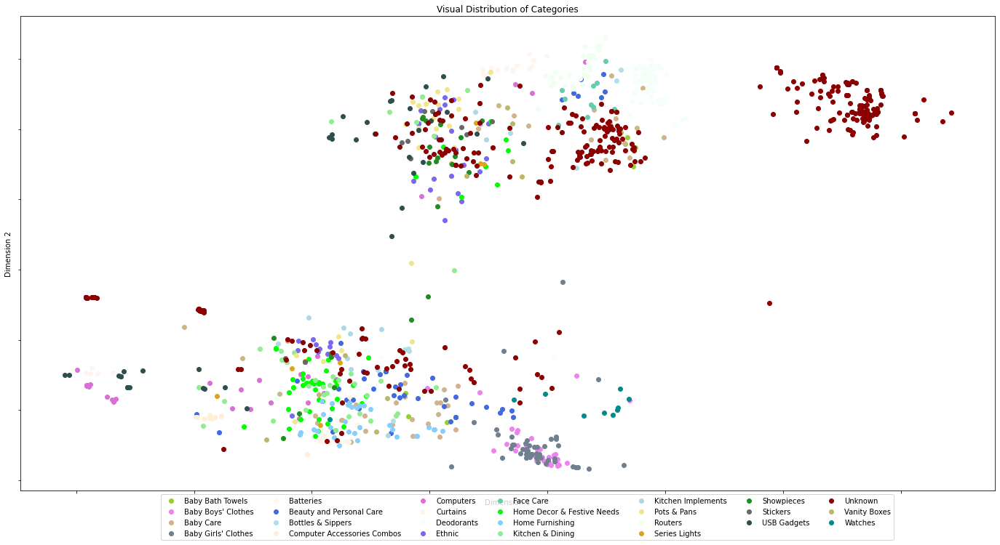

In [32]:
visualize_tsne(X_tsne_tfidf, labels_3, 'tfidf', '3', 'Text')
visualize_tsne(X_tsne_CBOW, labels_3, 'CBOW', '3', 'Text')
visualize_tsne(X_tsne_SkipGram, labels_3, 'SkipGram', '3', 'Text')

For this level of categories, we can see that it is very mixed. 

So far, it does not seem that we have some easy way to separated thoses categories but let's not forgot that we lost information with the reduction of dimensions. 

## Classifying ##

Now that the data is well processed and ready to be analysed, we will use several algorithms of supervised machine learning. 

For each classifier, we will give in entry the descriptions of our product embedded with one embedding method. In output we will give the categories associated with our product. We will try the three levels of categories for each classifier. 

Our data will be separated in a training set on which the learning algorithm will learn and a testing set on which we will see how well the classifier perform.

We will compile the results in a dictionnary to later build a table of all the results.

In [33]:
text_results_dict = {}

First, let's split our data into a train and test set for all levels of categories and all embedding methods. 

In [34]:
# We separate our data into test and train sets for all labels and all methods
label_list = [labels_1, labels_2, labels_3]
for i in range(len(label_list)):
    globals()['tfidf_set_{}'.format(i+1)] = train_test_separation(features, label_list[i])
    globals()['CBOW_set_{}'.format(i+1)] = train_test_separation(X_CBOW, label_list[i])
    globals()['SkipGram_set_{}'.format(i+1)] = train_test_separation(X_SkipGram, label_list[i])

### Naive Bayes Classifier ###

We will first use a Multinomial Naive Bayes classifier on our data and see the results. 

It is one of the simplest classifier, based on applying Bayes theorem on independence assumptions between the features. 

#### Categories of Level 1 ####

Our Naive Bayes Classifier has an accuracy of : 92.38% in 0.02s.


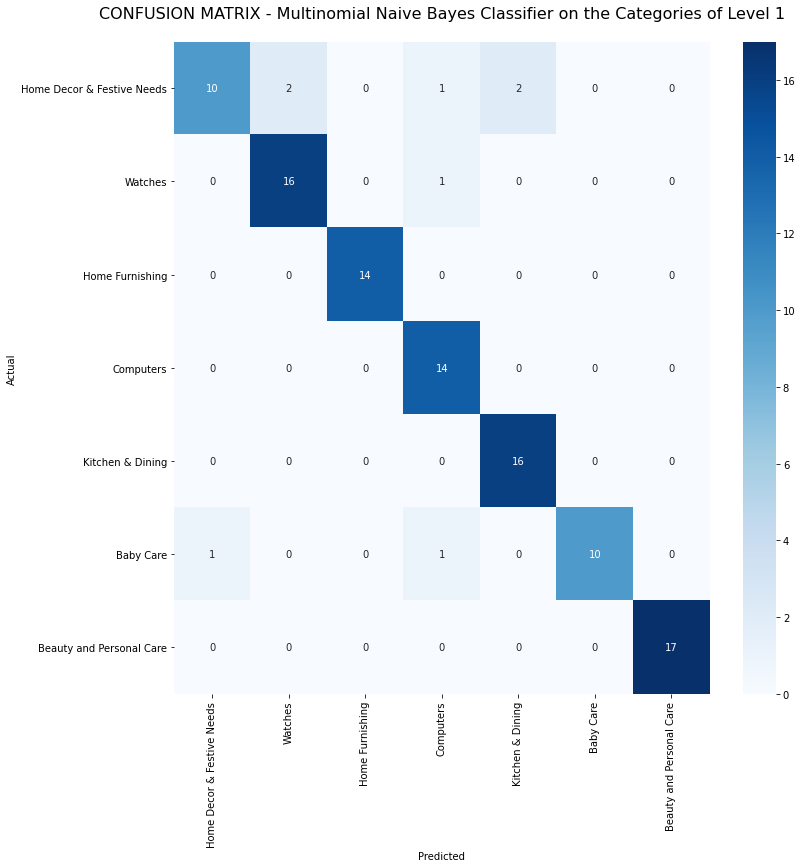

In [35]:
MNB_model_1 = MultinomialNB()
MNB_model_1_results = classic_classifier(MNB_model_1, tfidf_set_1, 'Multinomial Naive Bayes', labels_1)
text_results_dict['MNB_lvl_1'] = MNB_model_1_results

#### Categories of Level 2 ####

Our Naive Bayes Classifier has an accuracy of : 74.29% in 0.01s.


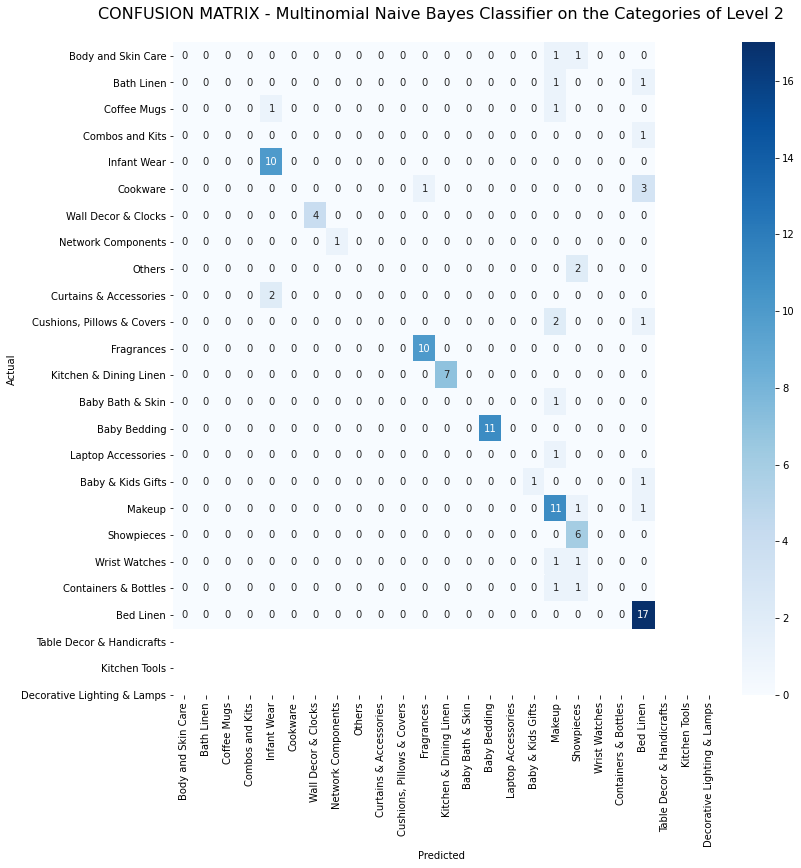

In [36]:
MNB_model_2 = MultinomialNB()
MNB_model_2_results = classic_classifier(MNB_model_2, tfidf_set_2, 'Multinomial Naive Bayes', labels_2)
text_results_dict['MNB_lvl_2'] = MNB_model_2_results

#### Categories of Level 3 ####

Our Naive Bayes Classifier has an accuracy of : 66.67% in 0.02s.


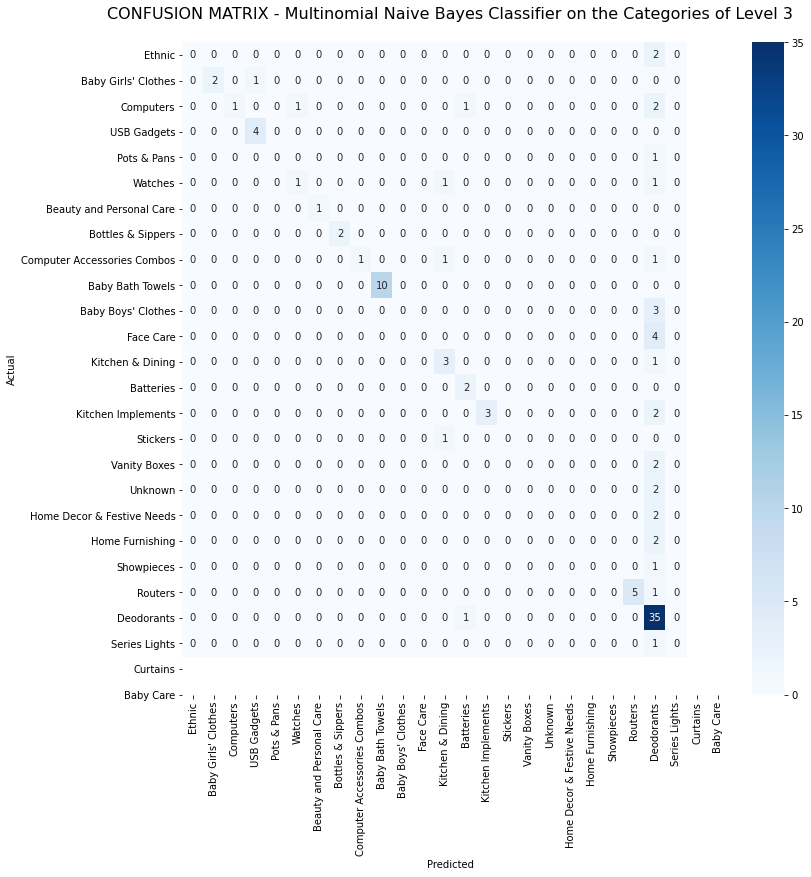

In [37]:
MNB_model_3 = MultinomialNB()
MNB_model_3_results = classic_classifier(MNB_model_3, tfidf_set_3, 'Multinomial Naive Bayes', labels_3)
text_results_dict['MNB_lvl_3'] = MNB_model_3_results

As we can see, the results are already quite satisfying, especialy for the level 1 categories. The results are rapidly decrease when we increase the number of categories, but with more samples, this could be fixed. We could also further enhanced the classifier on all level by crossvalidation.

### Random Forest ###

We will test a Random Forest as our second classifier to see if we obtain better results. 

Random Forests are a bit more complex classifier. They are based on several very simple decision trees deciding which results to give our input. We then take into account all the trees with different weights determined during the learning to take a single and ultimate decision.

#### Categories of Level 1 ####

Our Naive Bayes Classifier has an accuracy of : 92.38% in 0.52s.


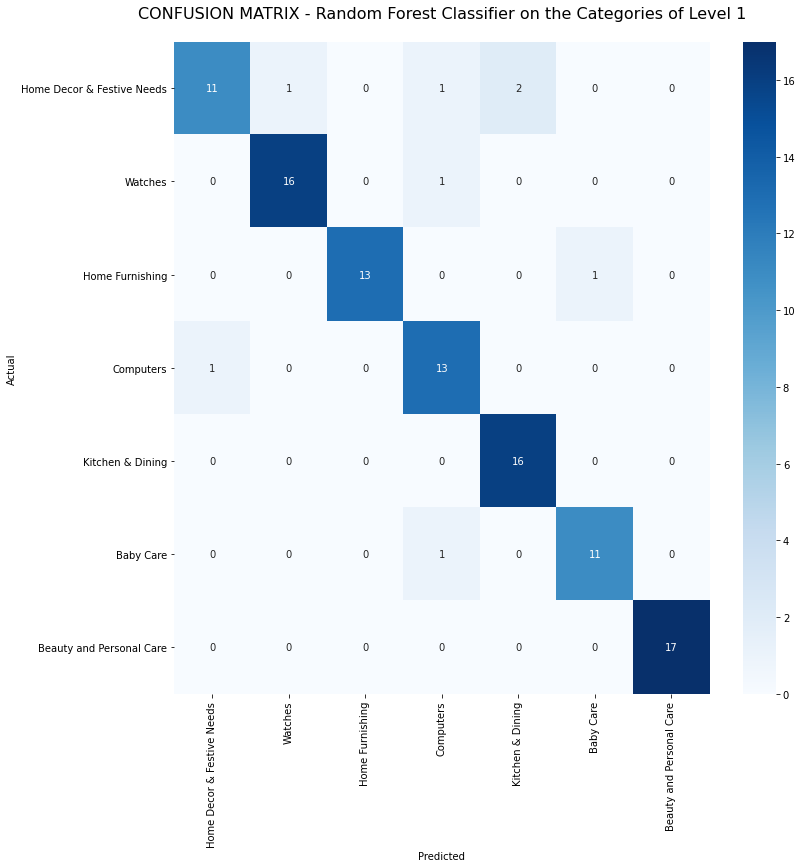

In [38]:
RF_model_1 = RandomForestClassifier(max_features="sqrt")
RF_model_1_results = classic_classifier(RF_model_1, tfidf_set_1, 'Random Forest', labels_1)
text_results_dict['RF_lvl_1'] = RF_model_1_results

#### Categories of Level 2 ####

Our Naive Bayes Classifier has an accuracy of : 86.67% in 0.57s.


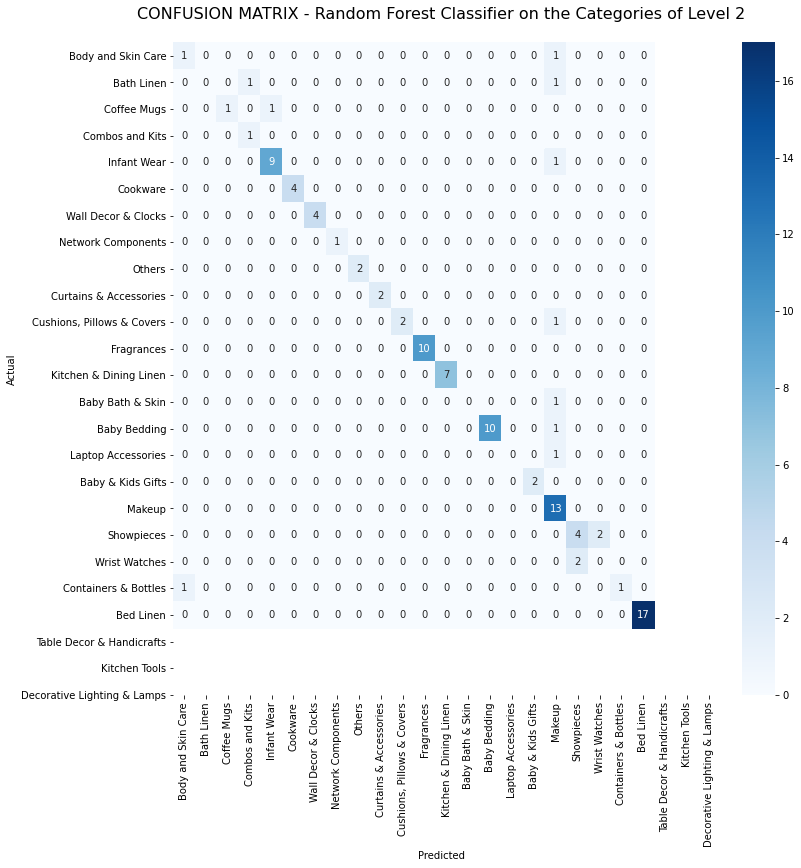

In [39]:
RF_model_2 = RandomForestClassifier(max_features="sqrt")
RF_model_2_results = classic_classifier(RF_model_2, tfidf_set_2, 'Random Forest', labels_2)
text_results_dict['RF_lvl_2'] = RF_model_2_results

#### Categories of Level 3 ####

Our Naive Bayes Classifier has an accuracy of : 82.86% in 0.61s.


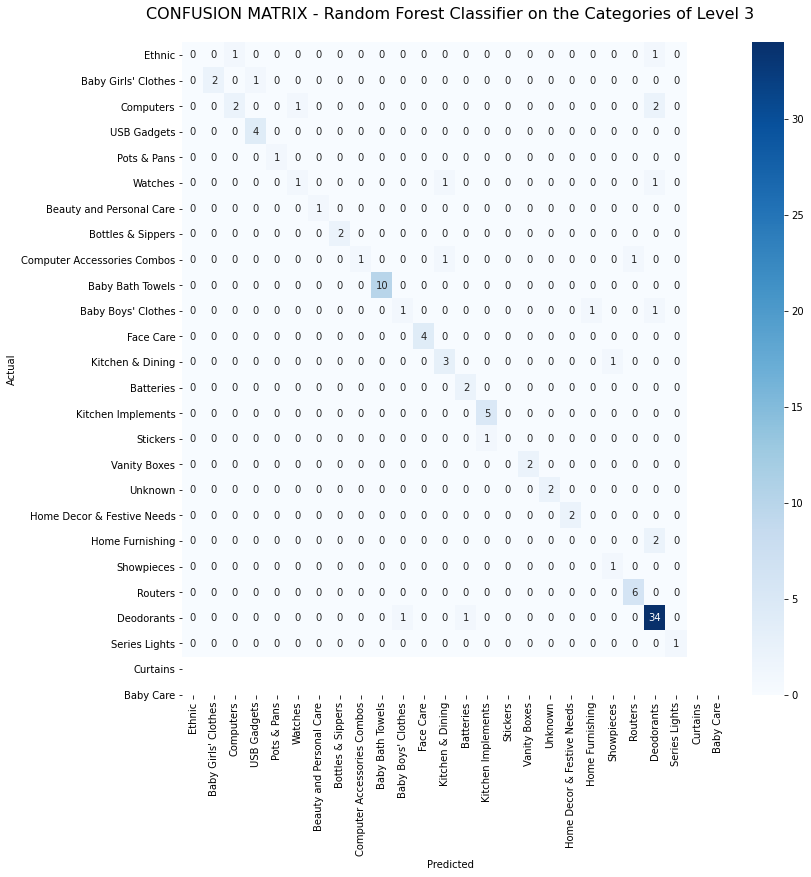

In [40]:
RF_model_3 = RandomForestClassifier(max_features="sqrt")
RF_model_3_results = classic_classifier(RF_model_3, tfidf_set_3, 'Random Forest', labels_3)
text_results_dict['RF_lvl_3'] = RF_model_3_results

Our results are even better! While the level 1 categories stay the ones with the better accuracy and time, the level 2 and 3 categories suffer a lot less accuracy loss than with the Naive Bayse classifier.

Again, some crossvalidation could improve the results.

### Reccurent Neural Network (RNN) ### 

Lastly, we will use a Reccurent Neural Network (RNN) and see how it performs compared to the last two classifiers. 

RNN are special Neural Network in the way that they have cycles acting as synapses inbetween the neurones. This give a non linear interconnection between the neurones. They are very close to natural neurones in that sense. 

They are particularly adapted to text classification due in part to their adaptation to different sizes of input. 

We will look at the different Word2Vec method (Skip Gram and Continuous BoW) and compare them.

#### Continuous Bag of Words ####

##### Categories of Level 1 #####

Our Recurrent Neural Network has an accuracy of : 80.00% in 13.77s.


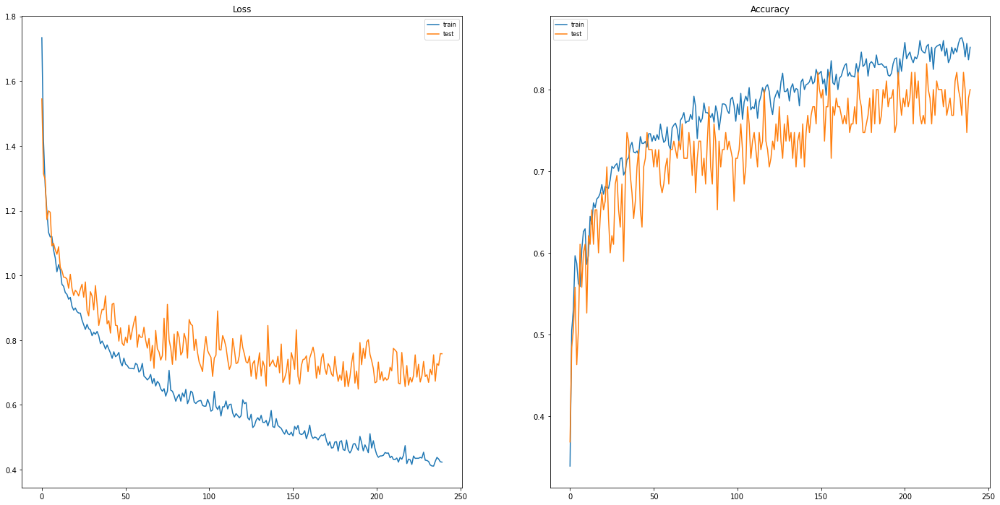

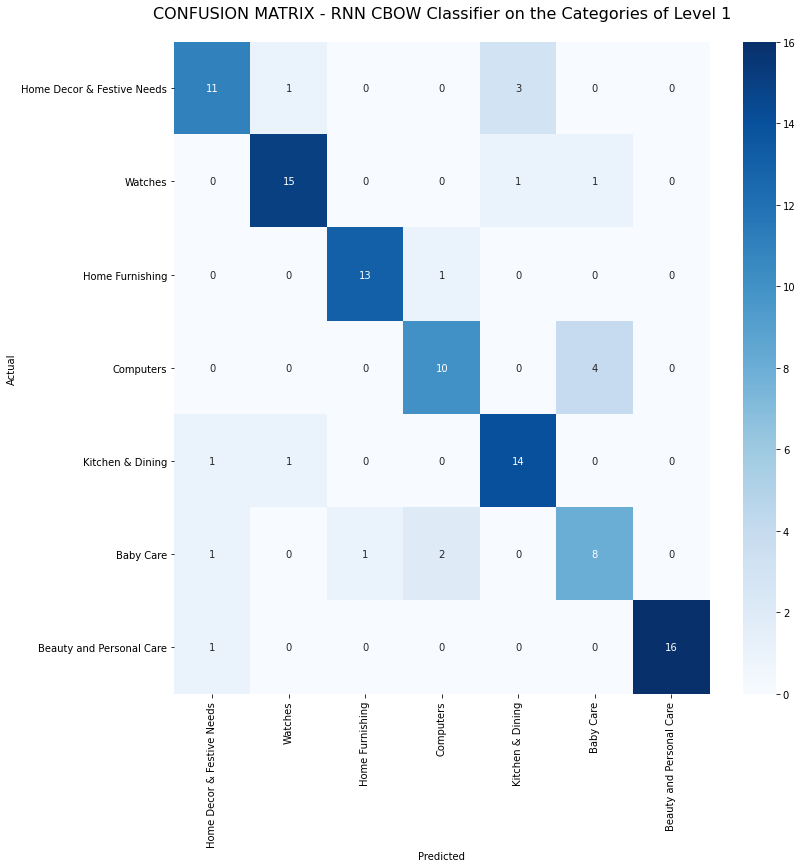

In [41]:
CBOW_RNN_model_1_results = RNN_classifier(CBOW_set_1, labels_1, 'CBOW')
text_results_dict['CBOWRNN_lvl_1'] = CBOW_RNN_model_1_results

##### Categories of Level 2 #####

Our Recurrent Neural Network has an accuracy of : 70.53% in 29.51s.


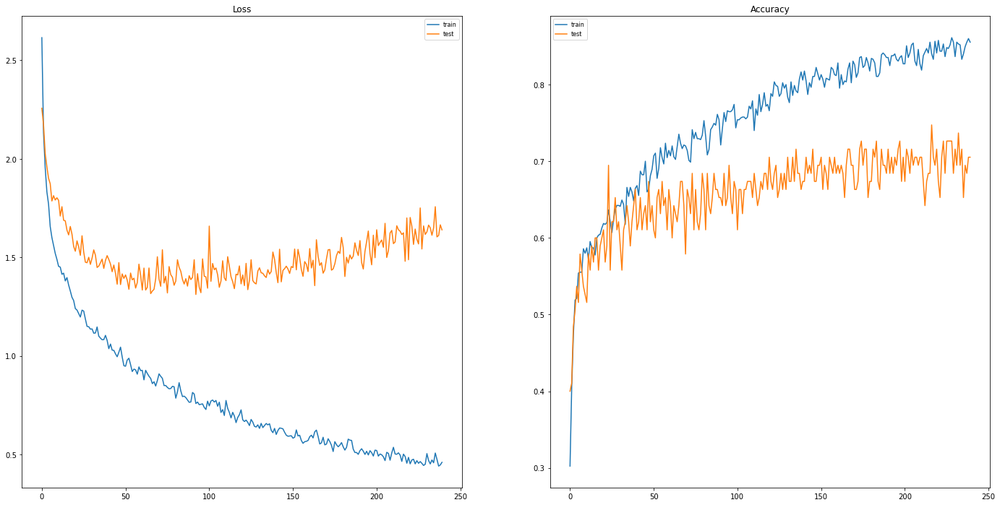

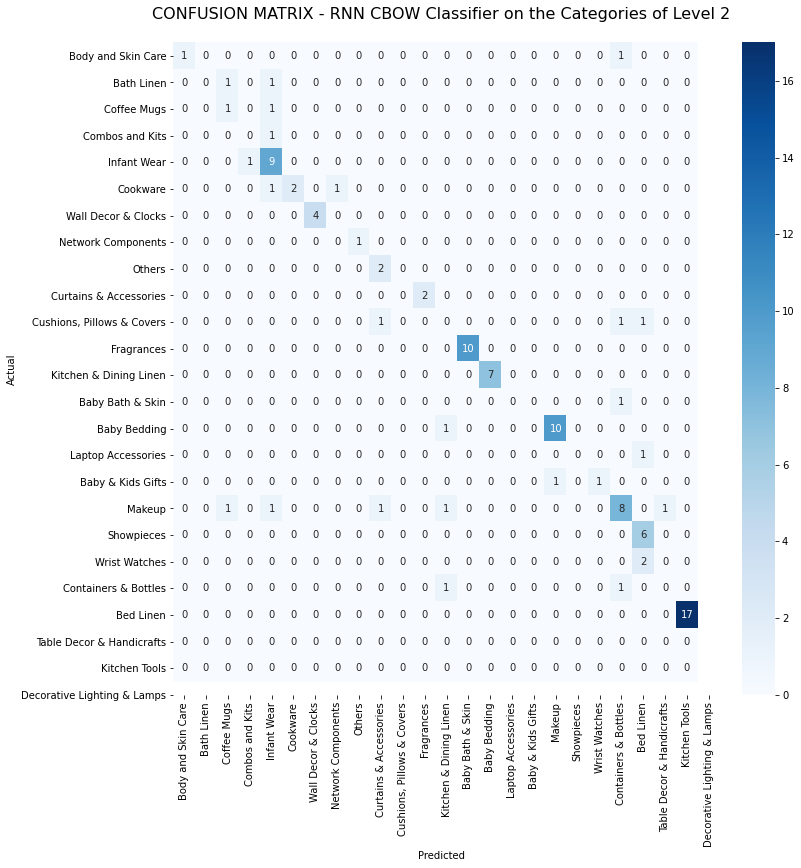

In [42]:
CBOW_RNN_model_2_results = RNN_classifier(CBOW_set_2, labels_2, 'CBOW')
text_results_dict['CBOWRNN_lvl_2'] = CBOW_RNN_model_2_results

##### Categories of Level 3 #####

Our Recurrent Neural Network has an accuracy of : 66.32% in 41.37s.


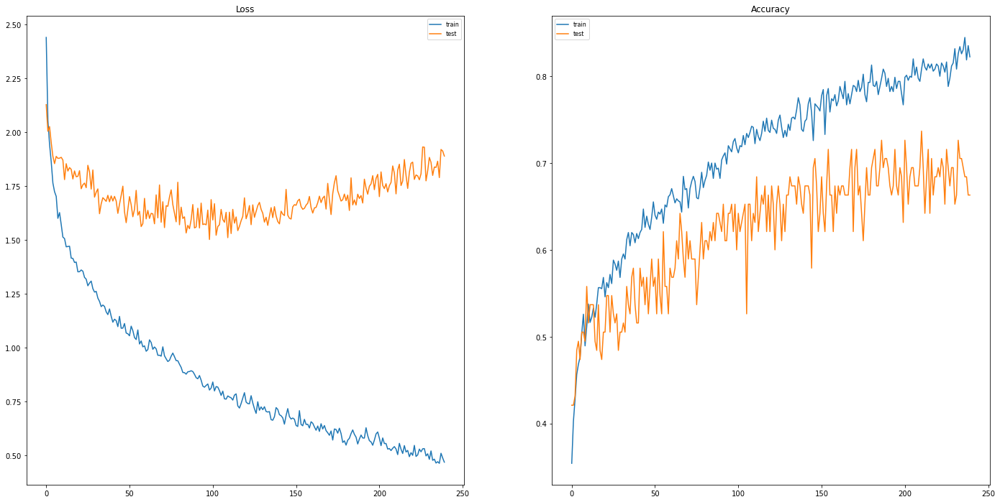

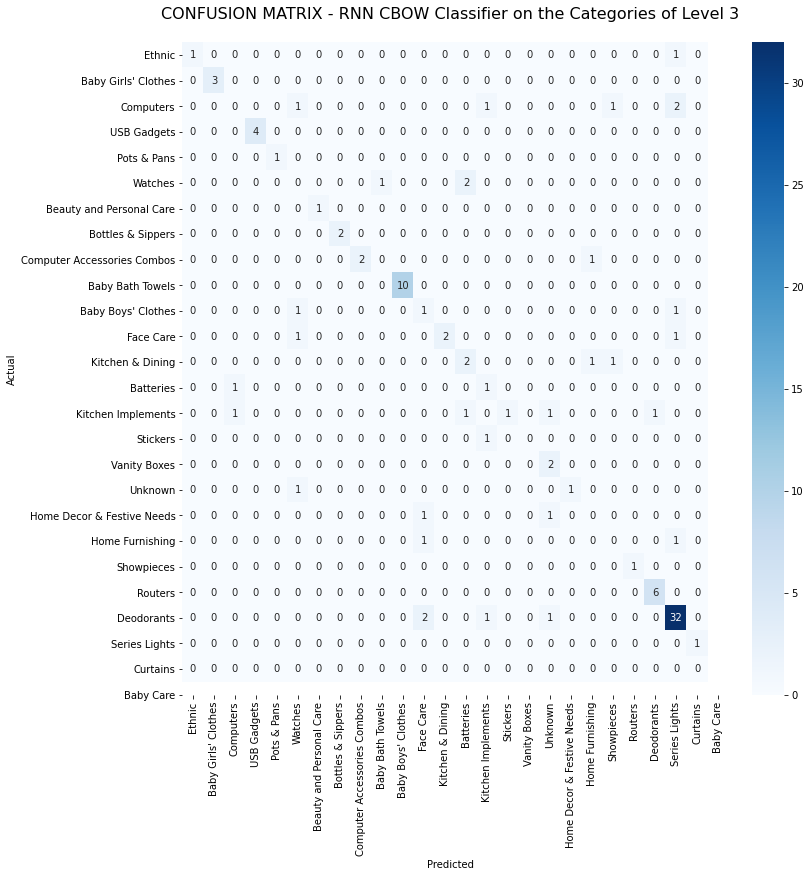

In [43]:
CBOW_RNN_model_3_results = RNN_classifier(CBOW_set_3, labels_3, 'CBOW')
text_results_dict['CBOWRNN_lvl_3'] = CBOW_RNN_model_3_results

We can see that our RNN has poorer accuracy than the simpler classifiers. One advantage it has is that it doesn't seem to be too much affected by the number of categories and the relative low level of samples given. 

Results could be better with a more refined neural network (this one is a very simple one) and more samples. 

#### Skip Gram ####

##### Categories of Level 1 #####

Our Recurrent Neural Network has an accuracy of : 92.63% in 17.02s.


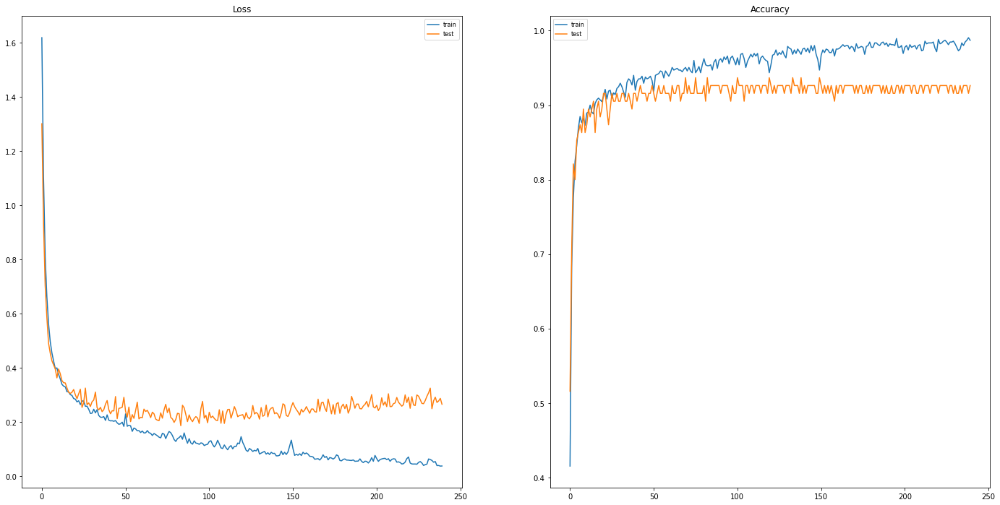

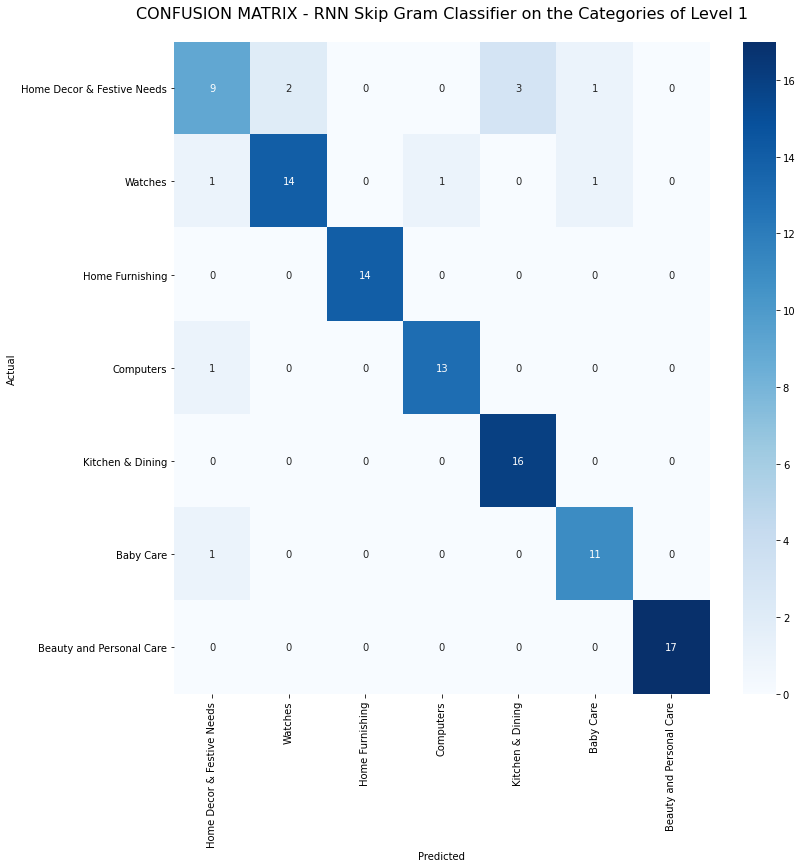

In [44]:
SkipGram_RNN_model_1_results = RNN_classifier(SkipGram_set_1, labels_1, 'Skip Gram')
text_results_dict['SGRNN_lvl_1'] = SkipGram_RNN_model_1_results

##### Categories of Level 2 #####

Our Recurrent Neural Network has an accuracy of : 84.21% in 28.09s.


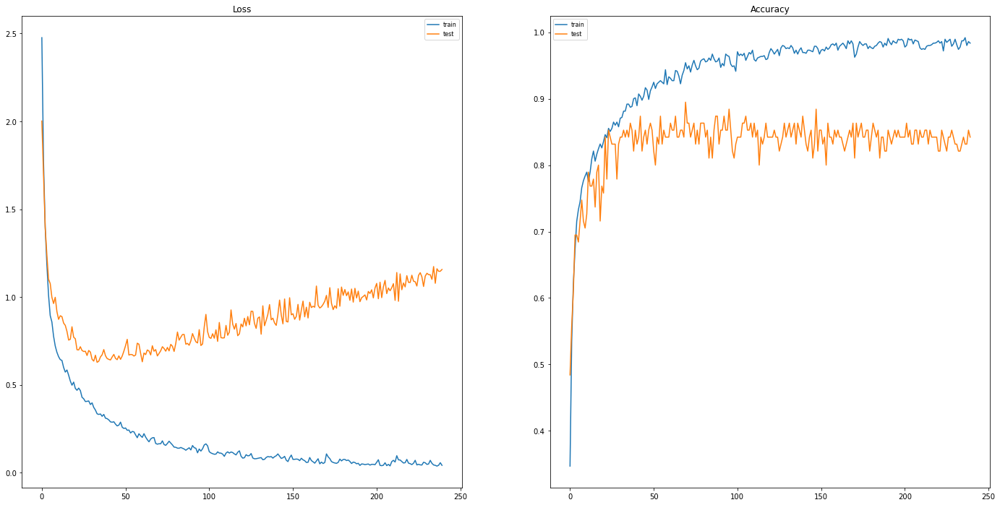

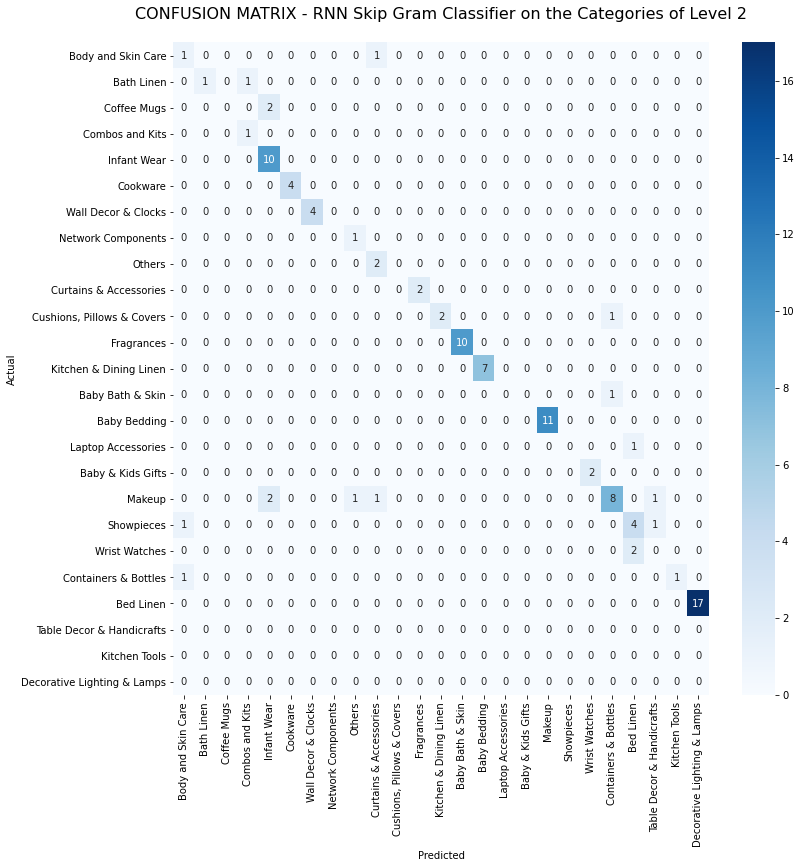

In [45]:
SkipGram_RNN_model_2_results = RNN_classifier(SkipGram_set_2, labels_2, 'Skip Gram')
text_results_dict['SGRNN_lvl_2'] = SkipGram_RNN_model_2_results

##### Categories of Level 3 #####

Our Recurrent Neural Network has an accuracy of : 80.00% in 29.88s.


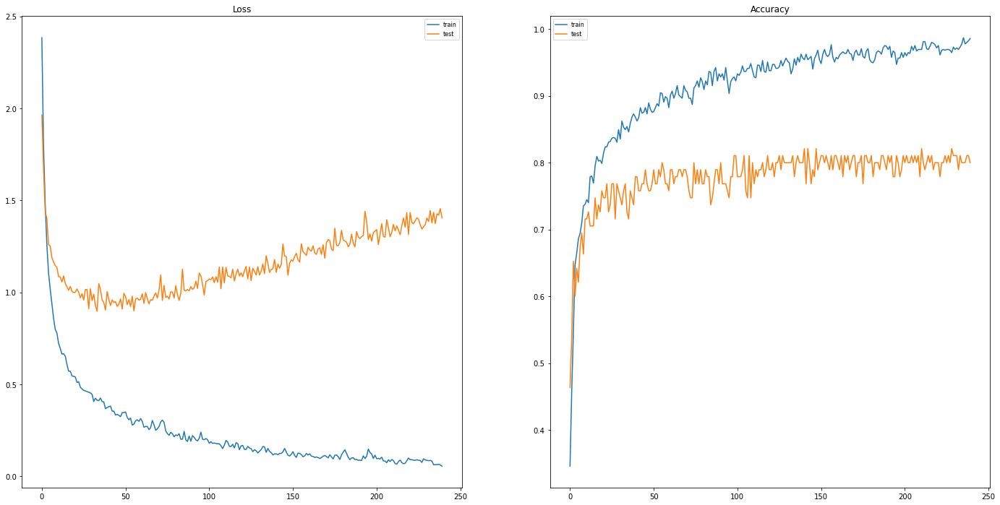

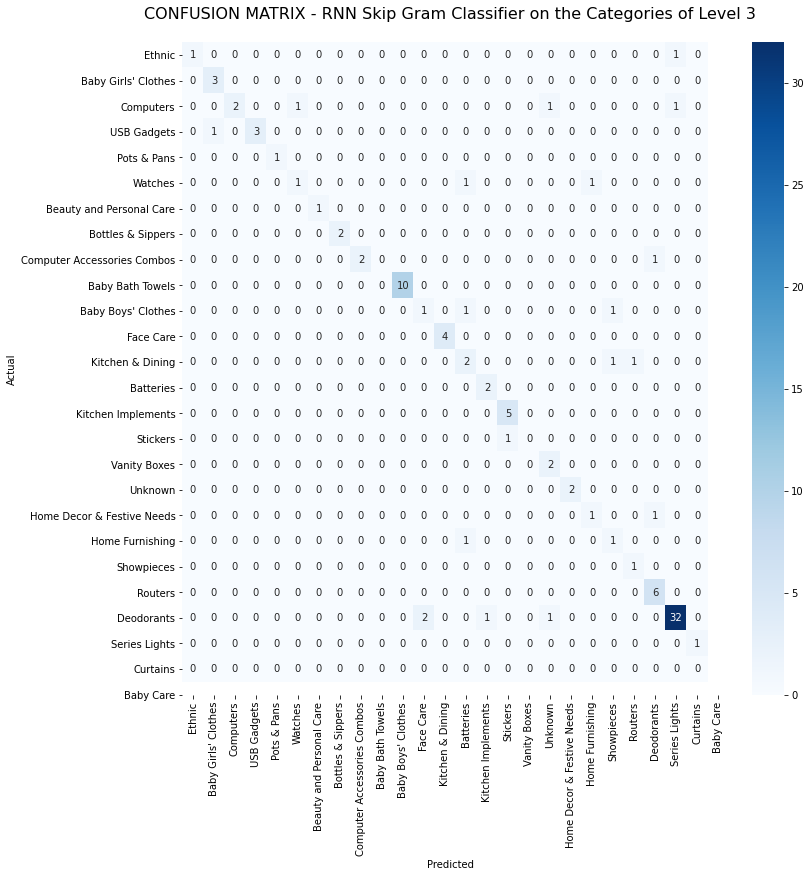

In [46]:
SkipGram_RNN_model_3_results = RNN_classifier(SkipGram_set_3, labels_3, 'Skip Gram')
text_results_dict['SGRNN_lvl_3'] = SkipGram_RNN_model_3_results

As predicted, we have better results on our data with the Skip Gram embedding. 

As before, the level of categories does not seem to change a lot of the accuracy and better results could be obtained with more samples and more optimized neural network.

## Conclusion on the text data ##

We will make a compilation of the results for the different embeddings and classifiers and see what does it show.

In [47]:
# Creation of the Data Frame
text_results_df = create_text_results_table(text_results_dict)
text_results_df

Accuracy       Time
Level of Category Model                                              
Level 1           Multinomial Naive Bayes        92.380952   0.023243
                  Random Forest                  92.380952   0.520511
                  RNN on Continuous Bag of Word  80.000001  13.767050
                  RNN on Skip Gram               92.631578  17.020003
Level 2           Multinomial Naive Bayes        74.285714   0.011050
                  Random Forest                  86.666667   0.568172
                  RNN on Continuous Bag of Word  70.526314  29.507907
                  RNN on Skip Gram               84.210527  28.094129
Level 3           Multinomial Naive Bayes        66.666667   0.022552
                  Random Forest                  82.857143   0.608572
                  RNN on Continuous Bag of Word  66.315788  41.373782
                  RNN on Skip Gram               80.000001  29.876024

As we can see, the simpler classifier such as the Multinomial Naive Bayes Classifier or the Random Forest Classifier are all around better than the Neural Networks. The MNB is better on the level 1 categories where the RF is better for the more numerous levels of categories.

It is important to note however that the Neural Networks can perform better with more epochs iterration and since they are very simple implementations, they could probably perform better with more optimizations.

# Image Data #

## Preprocessing ## 

As for the text data, we will have to go through several preprocesses before being able to use the information contained in the data.

For all the processes on image, we will show an example with a random image from the collection.

True

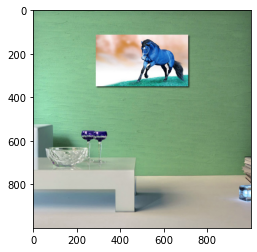

In [23]:
# Choosing a random image in the dataset
possible_positions = list(range(len(data_df)))
random_position = random.sample(possible_positions, 1)[0]

# Reading the image
test_image = cv.imread('Ressources' + '/' + 'Images' + '/' + data_df.loc[random_position, 'image'])
plt.imshow(test_image)

# Saving the test image
cv.imwrite('Ressources' + '/' + 'Soutenance' + '/' + 'test_image.png', test_image)

### Grey Scale ###

The first step will be to transform the image in grey scale. This is done to help the algorithms in finding patterns and help for the other image preprocessings. 

Usualy color image have a pixel with 3 dimensions representing the intensity of red, green and blue in the color. 

To transform it in grey scale, have to reduce these 3 dimensions to 1, representing the intensity of the pixel. 

True

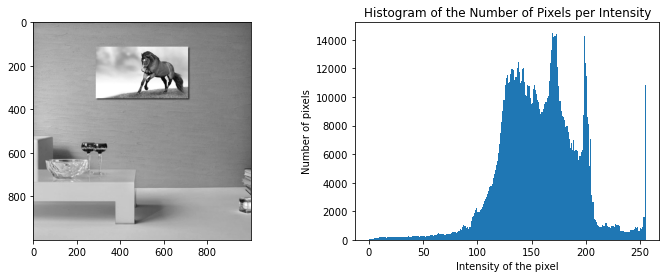

In [24]:
test_image_grey = cv.cvtColor(test_image, cv.COLOR_RGB2GRAY)
show_image_hist(test_image_grey)
cv.imwrite('Ressources' + '/' + 'Soutenance' + '/' + 'test_image_grey.png', test_image_grey)

### Exposition and Contrast ###

To each image, we can associate a histogram representing the number of pixel for each intensity (going from 0 to 255).

To be sure that our pictures look the best, we will look at its histogram arrange it.

For the best exposition, we will try to stretch the histogram, to be sure that every intensity available is used.

For the best contrast, we will try to normalize the histogram so that the pixel are evenly distributed between the dark and birght areas.

True

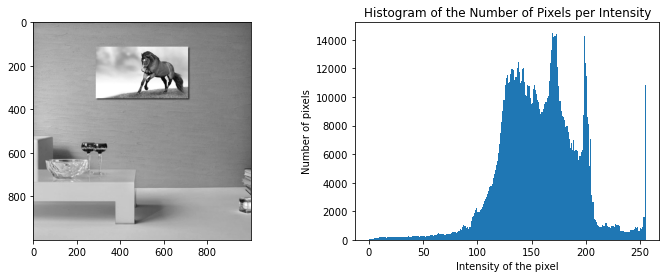

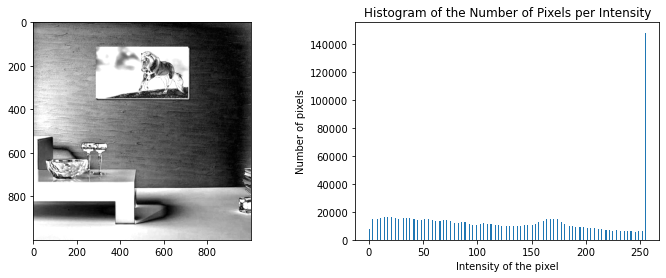

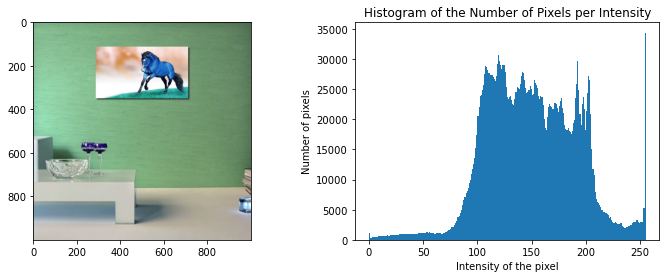

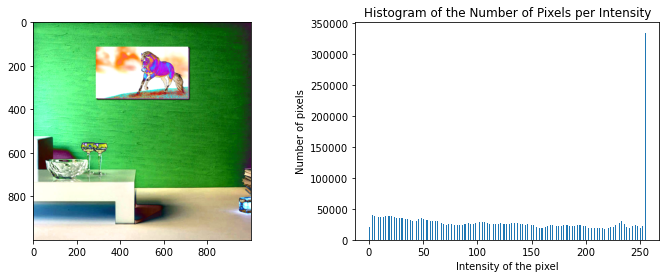

In [25]:
test_image_grey_corrected = automatic_brightness_and_contrast(test_image_grey)
test_image_corrected = automatic_brightness_and_contrast(test_image)

show_image_hist(test_image_grey)
show_image_hist(test_image_grey_corrected)
show_image_hist(test_image)
show_image_hist(test_image_corrected)
cv.imwrite('Ressources' + '/' + 'Soutenance' + '/' + 'test_image_grey_corrected.png', test_image_grey_corrected)
cv.imwrite('Ressources' + '/' + 'Soutenance' + '/' + 'test_image_corrected.png', test_image_corrected)

### Noise ###

We will now try to suppress the potential noise to will enhance the features extraction. 

To reduce noise, we apply a filter that will look at each pixel and compare it to its surounding. Depending on the filter type (mean, median, gaussian, etc), size (nearest neighbours, second row neighbours, etc), we will be able to reduce different noises.

#### Normalized Filter ####

One of the most common filter is the normalized filter. We will look at the first neighbours of the pixels and taking the mean of them  to apply it to the pixel. This will have for side effect to blur the image a little.

True

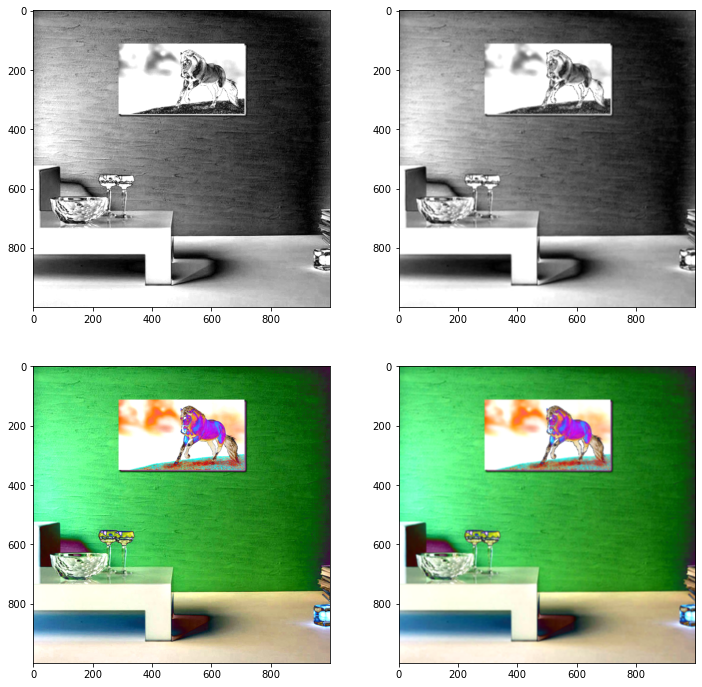

In [27]:
test_image_grey_filtered = filtering_image(test_image_grey_corrected)
test_image_filtered = filtering_image(test_image_corrected)

fig, ax = plt.subplots(2, 2, figsize = (12,12))
ax[0,0].imshow(test_image_grey_corrected, cmap='gray', vmin = 0, vmax = 255)
ax[0,1].imshow(test_image_grey_filtered, cmap='gray', vmin = 0, vmax = 255)
ax[1,0].imshow(test_image_corrected)
ax[1,1].imshow(test_image_filtered)
cv.imwrite('Ressources' + '/' + 'Soutenance' + '/' + 'test_image_grey_filtered.png', test_image_grey_filtered)
cv.imwrite('Ressources' + '/' + 'Soutenance' + '/' + 'test_image_filtered.png', test_image_filtered)

We will now apply all of these preprocessing to the images of all our products.

In [28]:
data_df = image_preprocessing(data_df)

## Features Extraction ##

Features of an image is what will caracterize the image. For example, a car as four wheels generaly, some windows, etc.

We have to extract the features of the different images to be able to compare and classify them.

### Create Descriptors ### 

Before getting to the features, we need ways to describe the image. To create this descriptors, we will take the most 'interesting' shape of the object. Generaly corners or specific shapes.

Method to create descriptors are numerous and varied. 

We will use the ORB method to create descriptors of all our images. 

Let's demonstrate it on our example first.

The Descriptors have a shape of (1200, 32).
 The Keypoints have a shape of (1200,).


True

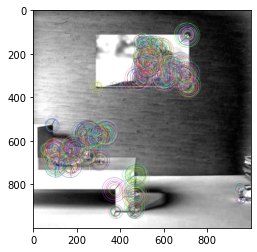

In [51]:
test_keypoints, test_descriptors = create_descriptors(test_image_grey_filtered)

print('''The Descriptors have a shape of {}.\n The Keypoints have a shape of {}.'''
      .format(np.shape(test_descriptors), np.shape(test_keypoints)))

test_image_keypoints = np.empty((test_image_grey_filtered.shape[0], 
                                test_image_grey_filtered.shape[1], 3), dtype=np.uint8)

cv.drawKeypoints(test_image_grey_filtered, test_keypoints, 
                                        test_image_keypoints, 
                                        flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(test_image_keypoints)
cv.imwrite('Ressources' + '/' + 'Soutenance' + '/' + 'test_image_keypoints.png', test_image_keypoints)

We can see that the algorithm detected the focal points of our object. They are the most representative of our object according to the ORB method used.

Now we can apply it to the whole collection.

In [30]:
des_list, all_images = fill_descriptors(data_df)

### Cluster Descriptors ###

In an analog manner to our text data, descriptors are like words. Now that we have the 'visual words' of each images, we want to know which ones are representative. 

To that end, we will cluster them into 'bags of visual words' thanks to an unsupervised machine learning method.

We will use the MiniBatch K-Means method since it is quite generalist and have good results on most of the problems.

In [54]:
# Stack the descriptors vertically in a numpy array
descriptors = des_list[0][1]
for path, descriptor in des_list[1:]:
    descriptors = np.vstack((descriptors, descriptor))
    
# K-Means working only on float, we will convert the descriptors
descriptors = descriptors.astype(float)

In [55]:
k = int(round(np.sqrt(len(des_list)), 0))
print('Estimated number of clusters : {}'.format(k))
t0 = time()

kmeans = MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(descriptors, k, 1)

voc = kmeans.cluster_centers_

t1 = time()
elapsed = t1 -t0
print('Clustering time : {:.2f}s.'.format(elapsed))

Estimated number of clusters : 32
Clustering time : 19.09s.


### Histogram per image (Bag of Visual Words) ###

Let's see the results on our example image.

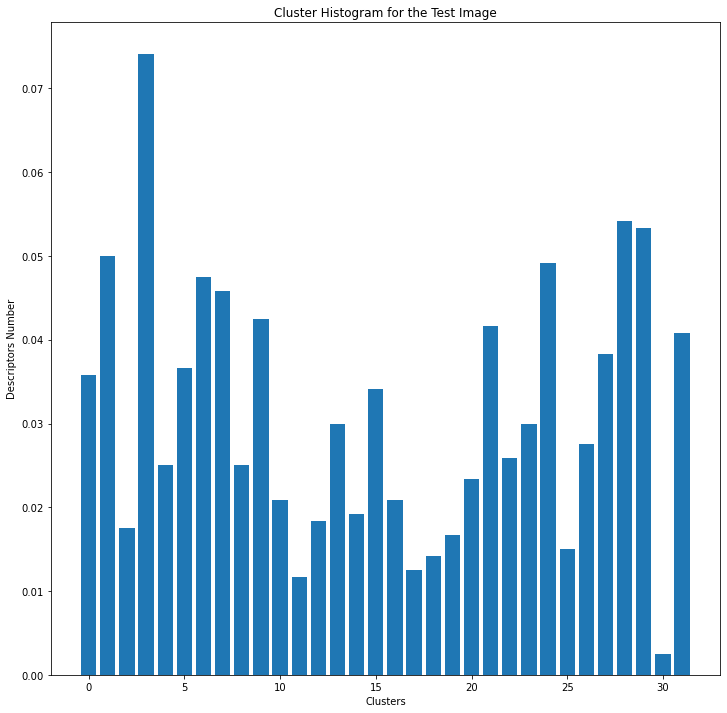

In [56]:
hist = build_histogram(kmeans, des_list[random_position][1], voc)

We can see the different visual words found in our image and how frequent they are. 

This can work as a kind of numeric ID of our image meaning. 

### Dimension Reduction ###

We will reduce the dimension of our descriptors to avoid any redundant informations described in our descriptors.

This will speed and ease up the classification.

In [58]:
# Extractions of the Images Features
img_features = np.zeros((len(data_df), k), 'float32')
for i in range(len(data_df)):
    words, distance = vq(des_list[i][1], voc)
    for w in words:
        img_features[i][w] += 1
        
# Scaling of the features
scaler = StandardScaler()
scaled_img_features = scaler.fit_transform(img_features)

In [59]:
# Doing the PCA
t0 = time()
pca = PCA(n_components=28)
X_PCA = pca.fit_transform(img_features)
pca_var = pca.explained_variance_ratio_.sum()
t1 = time()
pca_time = t1-t0

print('PCA with 28 components explains {:.2f} variance and is done in {:.2f}s.'
      .format(pca_var, pca_time))

PCA with 28 components explains 0.99 variance and is done in 0.02s.


We went from 32 clusters to 28 dimensions with the PCA. It is not a huge difference but can make the algorithms go a little bit faster.

### Visualisation ###

Thanks to a t-SNE, we will again visualize the distribution of our images and see if they fit the categories. 

In [60]:
# Computing t-SNE
tsne = TSNE(n_components=2, perplexity=600, n_iter=600)
t0 = time()
X_tsne_image = tsne.fit_transform(X_PCA)
t1 = time()
tsne_time = t1-t0
print('Time elapsed : {} s.'.format(tsne_time))

Time elapsed : 7.776320219039917 s.


Let's look at the data distribution to see if we see any pattern for the level 1 categories.

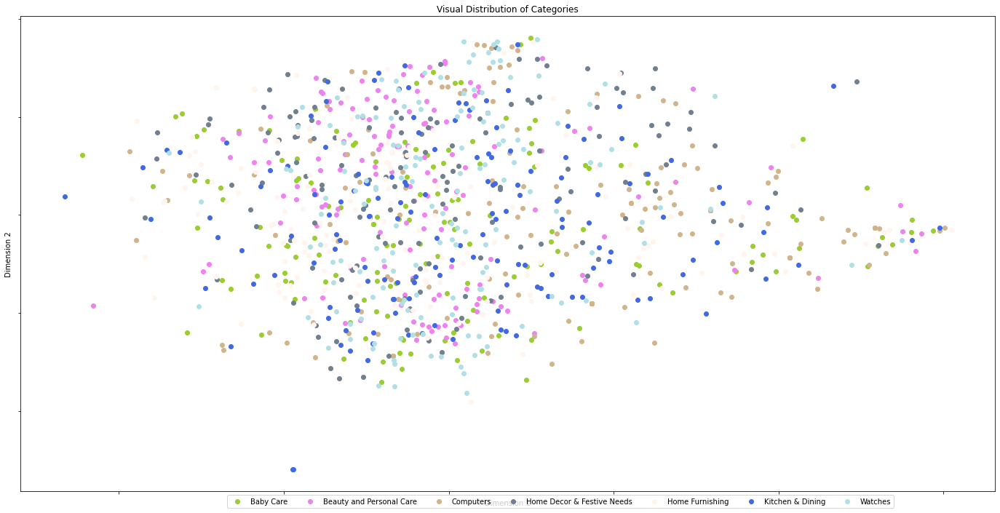

In [61]:
visualize_tsne(X_tsne_image, labels_1, 'VBOW', '1', 'Image')

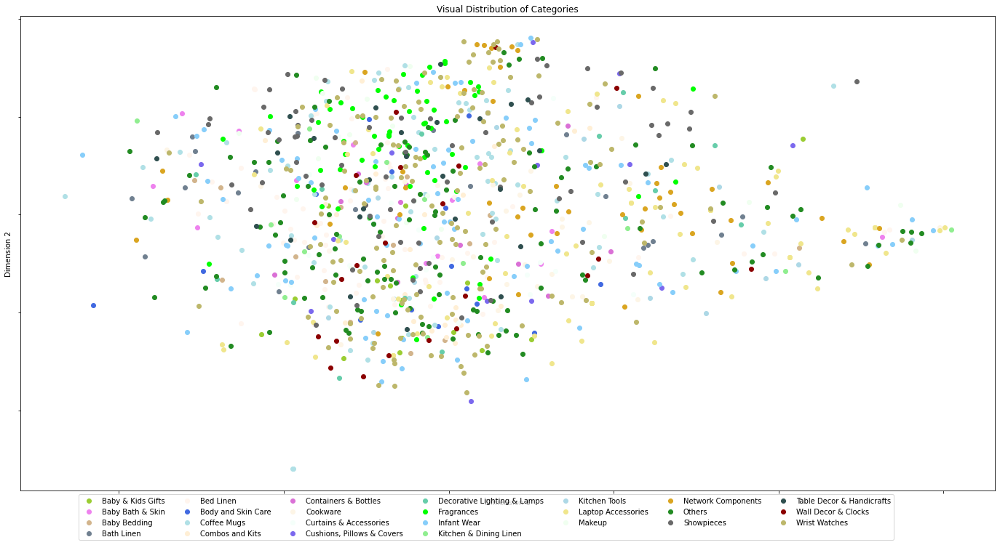

In [70]:
visualize_tsne(X_tsne_image, labels_2, 'VBOW', '2', 'Image')

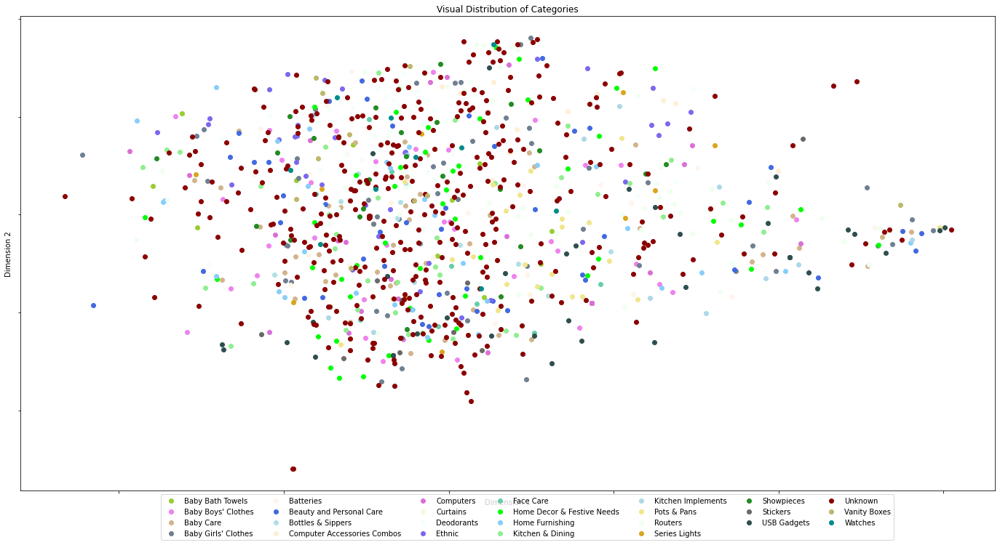

In [71]:
visualize_tsne(X_tsne_image, labels_3, 'VBOW', '3', 'Image')

On all levels, we can see that the categories are heavely mixed. Let's not forget however that the PCA neede a lot of dimensions not to lose too much informations so the 2D representations are probably misleading. 

### Classifier ###

As for the text data, now that the data is well processed and ready to be analysed, we will use several algorithms of supervised machine learning. 

We will start with a simple classifier, a Linear Support-Vector Clustering (Linear SVC). 

It is one of the most widely used clustering algorithm based on statistical learning frameworks. It will try to assign the new examples to one category making it a non probabilistic linear classifier.

For this classifier, we will give in entry the PCA done on our products images descriptors. In output we will give the categories associated with our product. We will try the three levels of categories for each classifier. 

Our data will be separated in a training set on which the learning algorithm will learn and a testing set on which we will see how well the classifier perform.

We will compile the results in a dictionnary to later build a table of all the results.

In [62]:
# We separate our data into test and train sets for all labels
label_list = [labels_1, labels_2, labels_3]
for i in range(len(label_list)):
    globals()['PCA_set_{}'.format(i+1)] = train_test_separation(scaled_img_features, label_list[i], 'Label')

# We create the dictionnary with all the results
image_results_dict = {}

#### Categories of Level 1 ####

Our Linear SVC Classifier has an accuracy of : 31.43% in 2.94s.


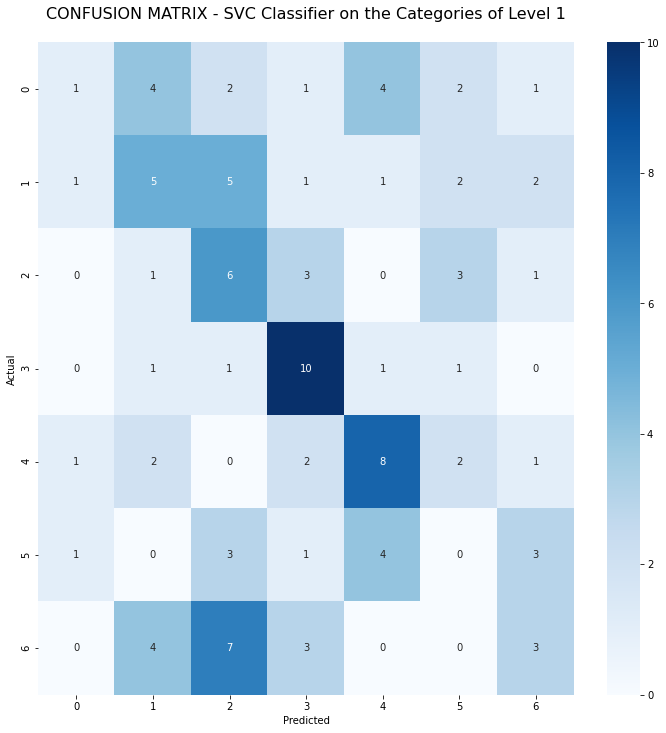

In [63]:
SVC_model_1_results = SVC_Classifier(PCA_set_1, 'SVC')
image_results_dict['SVC_lvl_1'] = SVC_model_1_results

#### Categories of Level 2 ####

Our Linear SVC Classifier has an accuracy of : 1.90% in 4.11s.


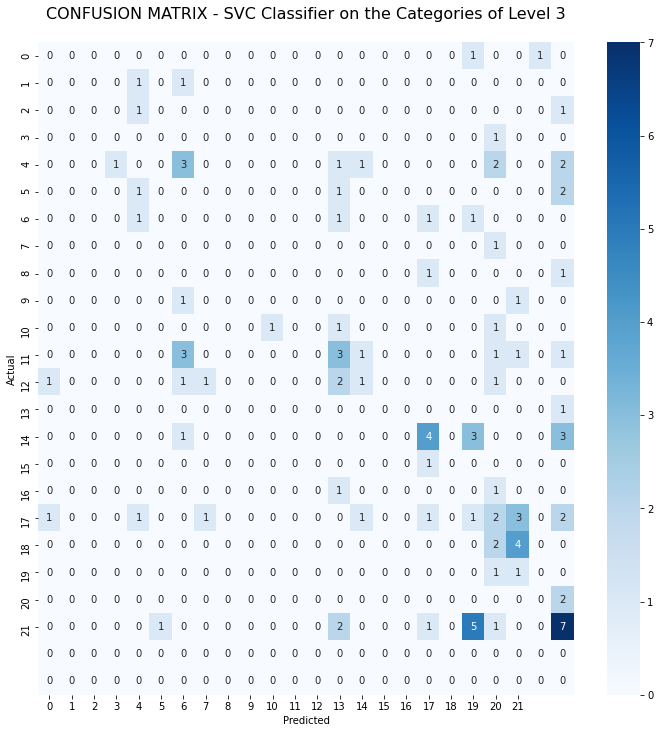

In [64]:
SVC_model_2_results = SVC_Classifier(PCA_set_2, 'SVC')
image_results_dict['SVC_lvl_2'] = SVC_model_2_results

#### Categories of Level 3 ####

Our Linear SVC Classifier has an accuracy of : 4.76% in 3.73s.


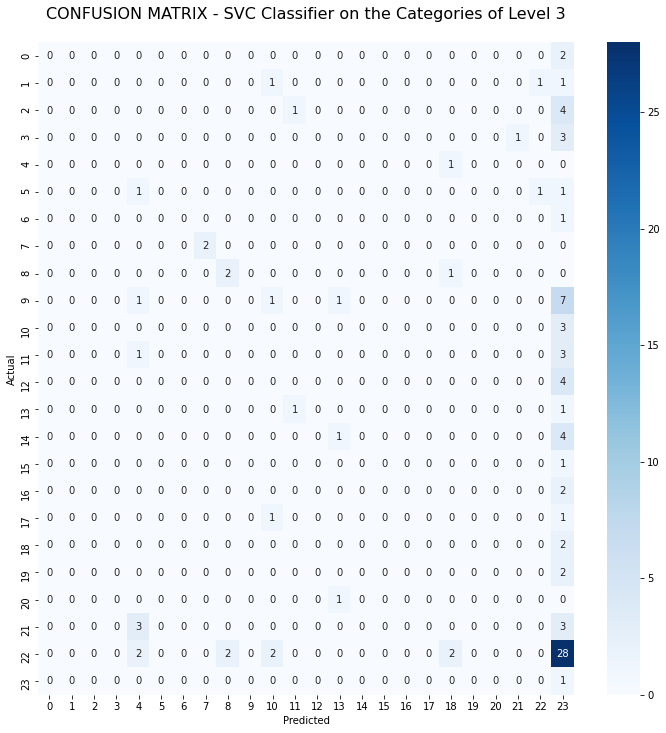

In [65]:
SVC_model_3_results = SVC_Classifier(PCA_set_3, 'SVC')
image_results_dict['SVC_lvl_3'] = SVC_model_3_results

We have very poor results especialy on the level 2 and 3 categories. The problem probably reside in the low number of samples per class. To be sure for a Linear SVC to work well, we would need several hundreds of sample for each category. 

Thus, classification of our products based on this model seems impossible. 

## Convolutional Neural Network (CNN) ##

We will now look and compare how a Convolutional Neural Network (CNN) performs.

CNN are inspired by the visual cortex of animals. They are several multilayers of parallel neurones (perceptrons) that will process low quantities of informations.

They are widely used in computer visual processing and need few initial parameters.

We will feed directly the images as input and keep the different levels of categories as output. 

#### Categories of Level 1 ####

Our Convolutional Neural Network has an accuracy of : 34.52% in 190.00s.


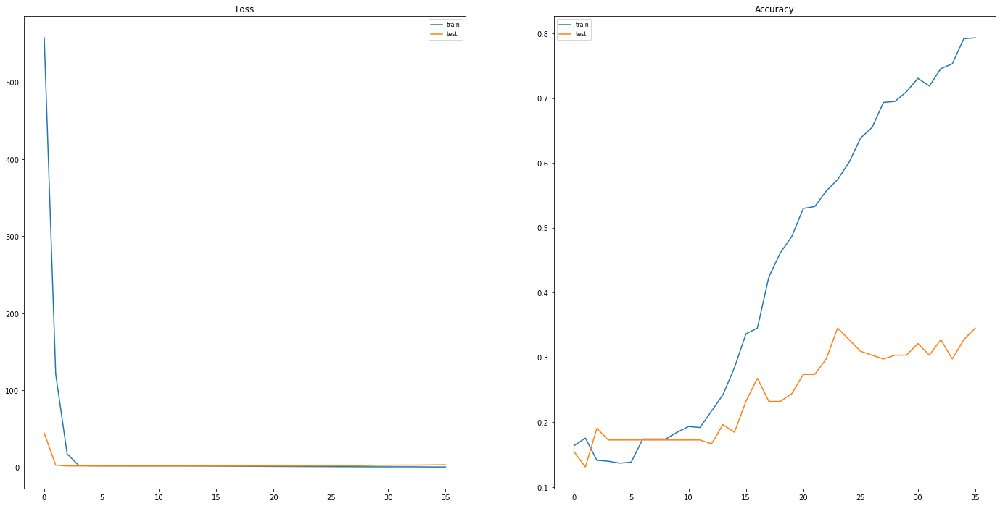

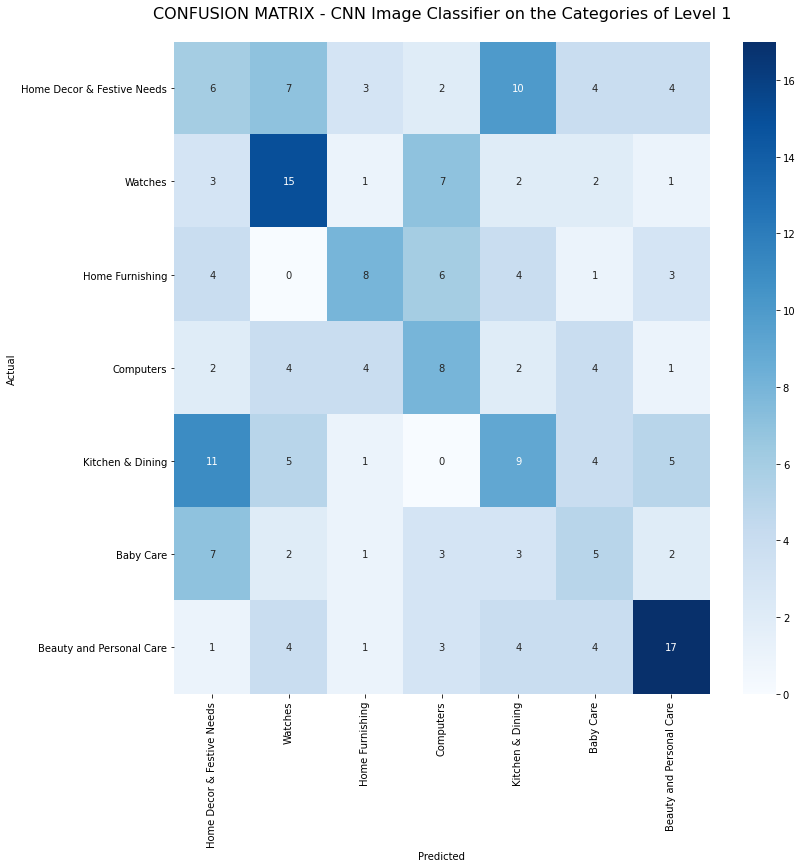

In [66]:
CNN_model_1_results = CNN_classifier(labels_1, all_images)
image_results_dict['CNN_lvl_1'] = CNN_model_1_results

#### Categories of Level 2 ####

Our Convolutional Neural Network has an accuracy of : 29.76% in 207.04s.


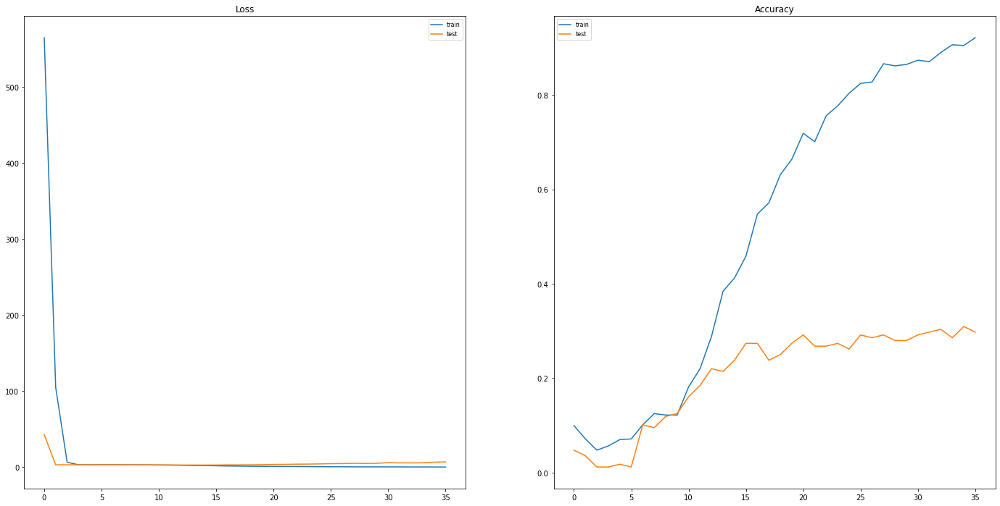

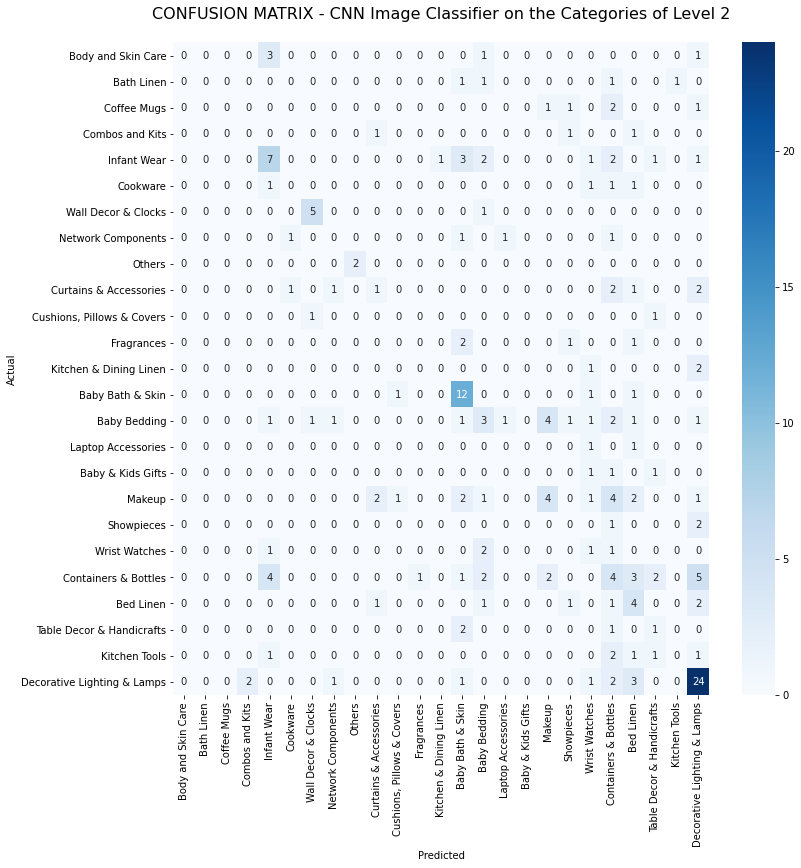

In [67]:
CNN_model_2_results = CNN_classifier(labels_2, all_images)
image_results_dict['CNN_lvl_2'] = CNN_model_2_results

#### Categories of Level 3 ####

Our Convolutional Neural Network has an accuracy of : 39.29% in 197.10s.


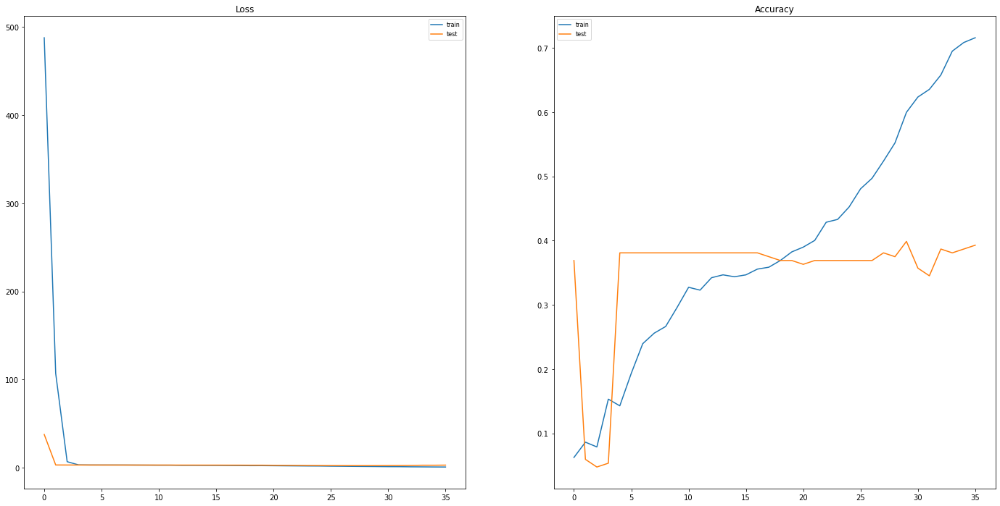

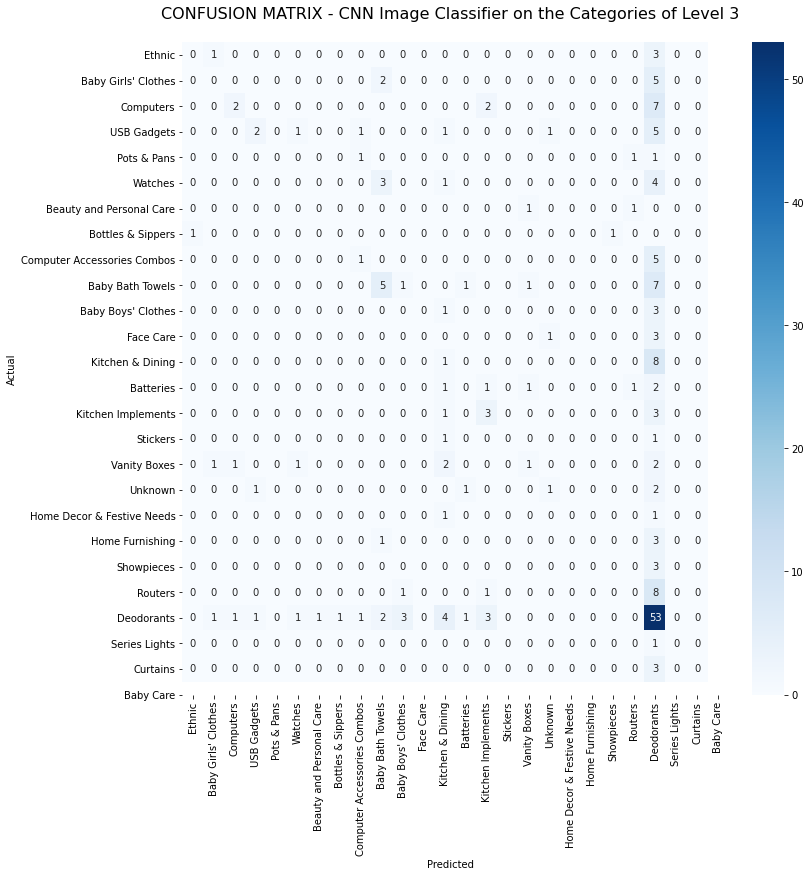

In [68]:
CNN_model_3_results = CNN_classifier(labels_3, all_images)
image_results_dict['CNN_lvl_3'] = CNN_model_3_results

The results are still not great but they are better than with the SVM. 

## Conclusion on the image data ##

Let's show all the results in a table. 

In [69]:
# Creation of the Data Frame
image_results_df = create_image_results_table(image_results_dict)
image_results_df

Accuracy        Time
Level of Category Model                            
Level 1           Linear SVC  31.428571    2.942513
                  CNN         34.523809  190.002122
Level 2           Linear SVC   1.904762    4.112777
                  CNN         29.761904  207.038256
Level 3           Linear SVC   4.761905    3.729364
                  CNN         39.285713  197.103601

As we can see, the results are quite poor, expecialy for the simple classifier. 

The CNN show better results and is not much affected by the number of categories. Although it takes a lot of time, the CNN could probably lead some decent results if optimized.

# Conclusion #

Through all this project, we saw how to process and classify unstructured data, more precisely text and images. 

If the results on the text classification are very good, the results on the image classification are not sufficient. 

Text classification is highly possible and with good results whereas image classification seems difficult and would need a great deal of further optimizations before being implementable. 

# Perspective #

Several possibilities exist to get better results. To help with the image classification, having more data or doing some data augmentation (copying with slight changes our data) would enable us to have enough image per category.

Perhaps using the GPU instead of the CPU and optimizing the Neural Networks would prove to be interesting.

Testing other classifiers and using transfert learning for the neural networks could lead to a better way of classifying.

One interesting thing to test would be to mixed the two of them in one classifier that would make a pre classification based on description and then check if the images matche. 